In [5]:
import matplotlib.pyplot as plt
import numpy as np
from os.path import dirname
from pylab import *
close('all')

# Script para a inicialização dos arquivos e criação do arquivo de elementos em cada caso-tempo-material
############################ Configuração Para inicialização #########################################
casos_pastas = ['Linac_1', 'Lifetime_1']  # Pastas de cada caso
normal = 1
casos_norm = [4, 1/5]     # normalização de cada caso
casos = ['150 MeV', '3 GeV']    # labels de cada caso

materiais_pastas = ['/MAT1', '/MAT2', '/MAT3', '/MAT4', '/MAT5']                         # Pastas dos materiais que serão usados
materiais = ['Aço Carbono', 'Aço Inox', 'Cobre', 'Alumínio', 'Chumbo']               # nomes dos materiais na mesma ordem das pastas

tempos_pastas = ['/IRR1', '/IRR2', '/IRR3', '/IRR4', '/IRR5', '/IRR6']                           # Pastas dos tempos de irradiação
tempos = ['1 semana', '1 mês', '1 ano', '5 anos', '10 anos', '20 anos']   # nomes dos tempos na mesma ordem das pastas

minimo = 0  # atividade mínima em bq para leitura
norm_lim = True # Normalização com o limite

file_out = '/Act_Sirius.txt'              # Nome do arquivo em cada pasta com o compilado de atividade
# f_usados = [0]                            # Lista dos arquivos a serem lidos
f_usados = list(range(0,12))              # Lista dos arquivos a serem lidos
fs = [ '/Act_Sirius_41_tab.lis',
       '/Act_Sirius_42_tab.lis',
       '/Act_Sirius_43_tab.lis',  #         ___________________________________________
       '/Act_Sirius_44_tab.lis',  #         |   0  |   1  |   2  |   3  |   4  |   5  |
       '/Act_Sirius_45_tab.lis',  # feixe   |__41__|__42__|__43__|__44__|__45__|__46__|
       '/Act_Sirius_46_tab.lis',  # ----->  |   6  |   7  |   8  |   9  |  10  |  11  |
       '/Act_Sirius_51_tab.lis',  #         |_ 51__|__52__|__53__|__54__|__55__|__56__|
       '/Act_Sirius_52_tab.lis',  #         |   0  |   1  |   2  |   3  |   4  |   5  |
       '/Act_Sirius_53_tab.lis',  #         |__41__|__42__|__43__|__44__|__45__|__46__|
       '/Act_Sirius_54_tab.lis',
       '/Act_Sirius_55_tab.lis',
       '/Act_Sirius_56_tab.lis']

# direct = dirname(__file__)
direct = ''
periodic = ['H',                                                                                                  'He',
            'Li', 'Be',                                                             'B',  'C',  'N',  'O',  'F',  'Ne',
            'Na', 'Mg',                                                             'Al', 'Si', 'P',  'S',  'Cl', 'Ar',
            'K',  'Ca', 'Sc', 'Ti', 'V',  'Cr', 'Mn', 'Fe', 'Co', 'Ni', 'Cu', 'Zn', 'Ga', 'Ge', 'As', 'Se', 'Br', 'Kr',
            'Rb', 'Sr', 'Y',  'Zr', 'Nb', 'Mo', 'Tc', 'Ru', 'Rh', 'Pd', 'Ag', 'Cd', 'In', 'Sn', 'Sb', 'Te', 'I',  'Xe',
            'Cs', 'Ba',
                 'La', 'Ce', 'Pr', 'Nd', 'Pm', 'Sm', 'Eu', 'Gd', 'Tb', 'Dy', 'Ho', 'Er', 'Tm', 'Yb',
                        'Lu', 'Hf', 'Ta', 'W',  'Re', 'Os', 'Ir', 'Pt', 'Au', 'Hg', 'Tl', 'Pb', 'Bi', 'Po', 'At', 'Rn',
            'Fr', 'Ra',
                 'Ac', 'Th', 'Pa', 'U',  'Np', 'Pu', 'Am', 'Cm', 'Bk', 'Cf', 'Es', 'Fm', 'Md', 'No',
                        'Lr', 'Rf', 'Db', 'Sg', 'Bh', 'Hs', 'Mt', 'Ds', 'Rg', 'Uub','Uut','Uuq','Uup','Uuh','Uus','Uuo']

##########################################################################################################################


def Limite_norm(activity, A, Z, m, norm_lim):
    if norm_lim:
        limi = open(direct + 'Limites.txt')
        limilines = limi.readlines()
        normactivity = 0.0
        lim_minimo = 1e4
        if m:
            isotope_name = periodic[Z-1] + str(A) + 'm'
        else:
            isotope_name = periodic[Z-1] + str(A)

        for line in limilines:
            if len(line.split())>0:
                if line.split()[0] == isotope_name:
                    if line.split()[2] == '-':
                        normactivity = activity/lim_minimo
                    else:
                        normactivity = activity / float(line.split()[2].replace(',','.'))
                    break
        return normactivity
        
    else:
        return activity



def Criar_arquivo(caso_i, tempo_j, material_k):
    totais = []
    totaiserr = []

    pasta = direct + casos_pastas[caso_i] + tempos_pastas[tempo_j] + materiais_pastas[material_k]
    normalization = casos_norm[caso_i]

    fsaida = open(pasta + file_out, 'w+')
    if caso_i == casos_pastas[0]:
        fsaida2 = open(direct + casos_pastas[caso_i] + tempos_pastas[tempo_j] + '.txt', 'w+')
    else:
        fsaida2 = open(direct + casos_pastas[caso_i] + tempos_pastas[tempo_j] + '.txt', 'a')
        fsaida2.write('\n')

    if norm_lim:
        fsaida.write('Atividade normalizada pelos limites das regiões, '+ pasta + '\n')
        fsaida2.write('Atividade normalizada pelos limites das regiões, '+ pasta + '\n')
    else:
        fsaida.write('Atividade Total das regiões, '+ pasta + '\n')
        fsaida2.write('Atividade Total das regiões, '+ pasta + '\n')
    fsaida.write('Elemento\tZ\tA\tBq\tErro (%)\n')
    fsaida2.write('Elemento\tZ\tA\tBq\tErro (%)\n')

    isotope = np.zeros([250,100])
    isotopemeta = np.zeros([250,100])
    isotopeerr = np.zeros([250,100])
    isotopemetaerr = np.zeros([250,100])
    total = 0
    totalerr = 0

    for cont in f_usados:
        f = open(pasta + fs[cont], 'r')
        f.seek(0)
        lines=f.readlines()
        k=0

        for j in range(3,len(lines)):

            if '# A/Z/m Isomers:' in lines[j]:
                k=2

            if k==0:
                if float(lines[j].split()[2]) > 0:
                    A = int((lines[j].split()[0]))
                    Z = int((lines[j].split()[1]))
                    act = Limite_norm(float(lines[j].split()[2])*normalization, A, Z, False, norm_lim)
                    if isotope[A, Z] + act > 0:
                        isotopeerr[A, Z] = np.sqrt( (isotopeerr[A, Z]*isotope[A, Z])**2 + (float(lines[j].split()[3])*act)**2 ) / (isotope[A, Z] + act)
                    else:
                        isotopeerr[A, Z] = 0
                    isotope[A, Z] = isotope[A, Z] + act
                    if total + act > 0:
                        totalerr = np.sqrt( (totalerr*total)**2 + (float(lines[j].split()[3])*act)**2 ) / (total + act)
                    else:
                        totalerr = 0
                    total = total + act

            elif k==1:
                if float(lines[j].split()[3]) > 0:
                    A = int((lines[j].split()[0]))
                    Z = int((lines[j].split()[1]))
                    act = Limite_norm(float(lines[j].split()[3])*normalization, A, Z, True, norm_lim)
                    if isotopemeta[A, Z] + act > 0:
                        isotopemetaerr[A, Z] = np.sqrt((isotopemetaerr[A, Z]*isotopemeta[A, Z])**2 + (float(lines[j].split()[4])*act)**2 ) / (isotopemeta[A, Z] + act) 
                    else:
                        isotopemetaerr[A, Z] = 0
                    isotopemeta[A, Z] = isotopemeta[A, Z] + act
                    if total + act > 0:
                        totalerr = np.sqrt( (totalerr*total)**2 + (float(lines[j].split()[4])*act)**2 ) / (total + act)
                    else:
                        totalerr = 0
                    total = total + act
            else:
                k=1
    
    for lin in range(0, 250):
        for col in range (0, 100):
            if isotope[lin, col] > minimo:
                # print(periodic[col-1] + str(lin) + ' ' + 
                #         str(col) + ' ' + str(lin) + ' ' + 
                #         format(isotope[lin, col], '.2e').replace('.',',') + ' ' + 
                #         format(isotopeerr[lin, col], '.2e').replace('.',','))
                fsaida.write(periodic[col-1] + str(lin) + '\t' + 
                            str(col) + '\t' + str(lin) + '\t' + 
                            format(isotope[lin, col], '.2e').replace('.',',') + '\t' + 
                            format(isotopeerr[lin, col], '.2e').replace('.',',') + '\n')
                fsaida2.write(periodic[col-1] + str(lin) + '\t' + 
                            str(col) + '\t' + str(lin) + '\t' + 
                            format(isotope[lin, col], '.2e').replace('.',',') + '\t' + 
                            format(isotopeerr[lin, col], '.2e').replace('.',',') + '\n')
    
    for lin in range(0, 250):
        for col in range (0, 100):
            if isotopemeta[lin, col] > minimo:
                fsaida.write(periodic[col-1] + str(lin) + 'm\t' + 
                            str(col) + '\t' + str(lin) + '\t' + 
                            format(isotopemeta[lin, col], '.2e').replace('.',',') + '\t' + 
                            format(isotopemetaerr[lin, col], '.2e').replace('.',',') + '\n')
                fsaida2.write(periodic[col-1] + str(lin) + 'm\t' + 
                            str(col) + '\t' + str(lin) + '\t' + 
                            format(isotopemeta[lin, col], '.2e').replace('.',',') + '\t' + 
                            format(isotopemetaerr[lin, col], '.2e').replace('.',',') + '\n')

    totais.append(total)
    totaiserr.append(totalerr)
    # grandetotalerr = np.sqrt( (grandetotalerr*grandetotal)**2 + (totalerr*total)**2 ) / (grandetotal + total)
    # grandetotal = grandetotal + total

    return(total, totalerr)


def Iniciar_variavel():
    for i, caso in enumerate(casos):
        atividades_dict[caso] = []
        atividadeserr_dict[caso] = []
        for j, tempo in enumerate(tempos_pastas):
            atividades_dict[caso].append([])
            atividadeserr_dict[caso].append([])
            for k, material in enumerate(materiais_pastas):
                atividades_dict[caso][j].append([])
                atividadeserr_dict[caso][j].append(0)
                atividades_dict[caso][j][k], atividadeserr_dict[caso][j][k] = Criar_arquivo(i, j, k)

    for caso in casos:
        print(caso + ':')
        print( ''.join(['{:15}'.format(item) for item in ['Tempos'] + materiais]) )
        for j, tempo in enumerate(tempos):
            # print(tempo + ' = ' + str(atividades_dict[caso][j]))
            # print(['{:20}'.format(tempo)] + ['{:20}'.format( '{:.3E}'.format(item) ) for item in atividades_dict[caso][j]] )
            print(''.join(['{:15}'.format(tempo)] + ['{:15}'.format( '{:.3E}'.format(item) ) for item in atividades_dict[caso][j]]) )
        print('')

atividades_dict = {}
atividadeserr_dict = {}
Iniciar_variavel()

150 MeV:
Tempos         Aço Carbono    Aço Inox       Cobre          Alumínio       Chumbo         
1 semana       1.397E-01      2.414E-01      1.493E+00      9.373E-02      1.352E-01      
1 mês          2.617E-01      4.521E-01      1.510E+00      9.416E-02      1.559E-01      
1 ano          9.726E-01      1.357E+00      1.582E+00      9.902E-02      1.979E-01      
5 anos         2.529E+00      2.567E+00      1.622E+00      1.105E-01      3.145E-01      
10 anos        3.135E+00      2.983E+00      1.646E+00      1.149E-01      3.792E-01      
20 anos        3.353E+00      3.133E+00      1.663E+00      1.165E-01      4.155E-01      

3 GeV:
Tempos         Aço Carbono    Aço Inox       Cobre          Alumínio       Chumbo         
1 semana       1.127E-01      1.732E-01      7.815E-01      1.095E-01      7.560E-02      
1 mês          1.988E-01      2.978E-01      8.011E-01      1.099E-01      9.080E-02      
1 ano          5.146E-01      7.050E-01      8.621E-01      1.132E-01    

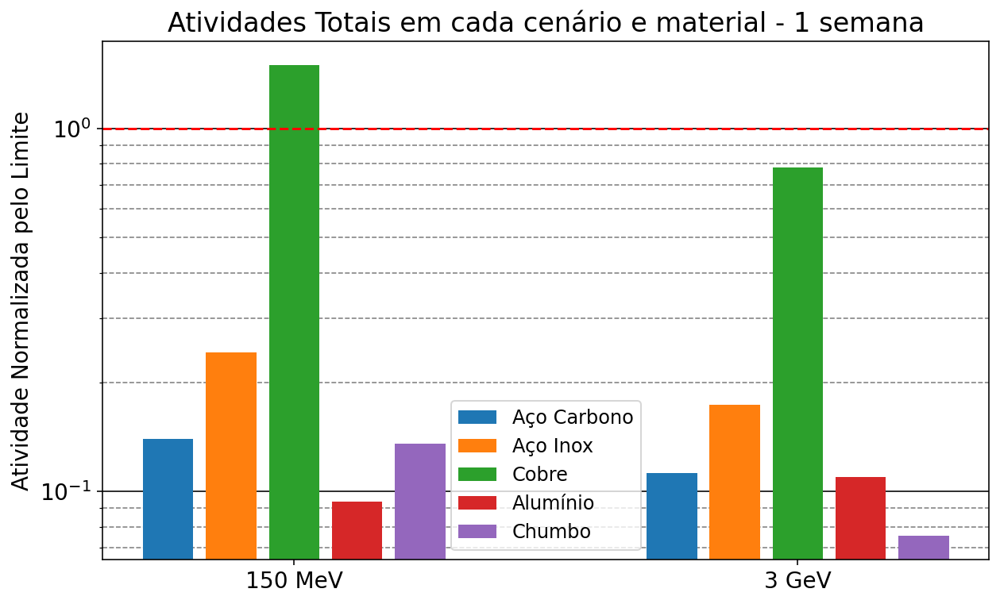

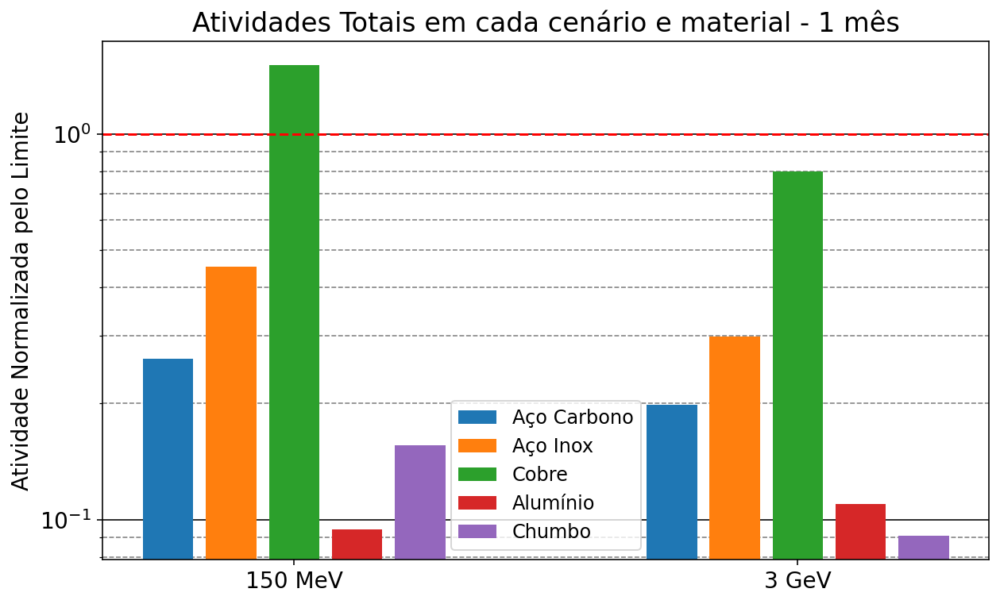

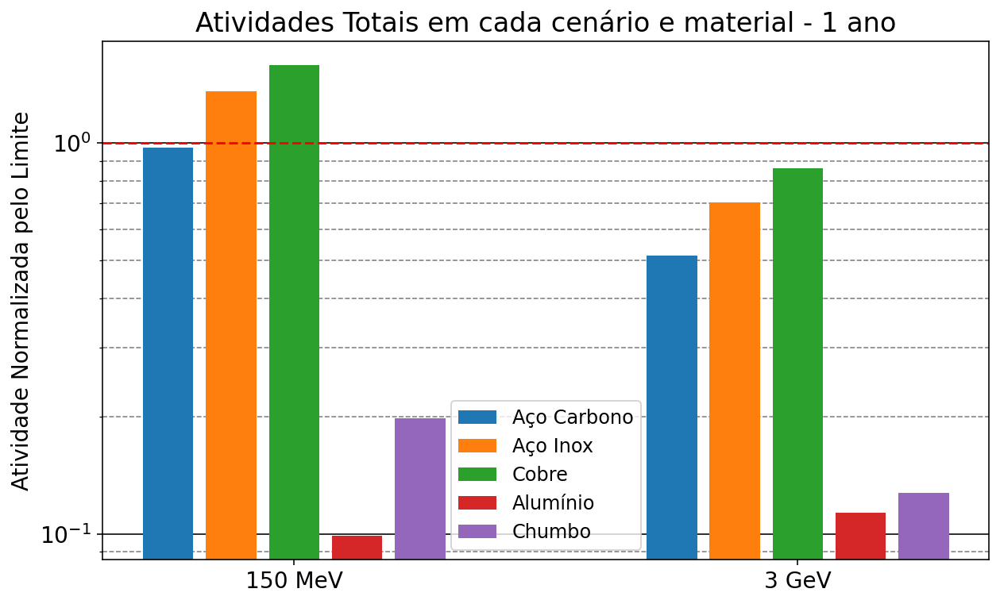

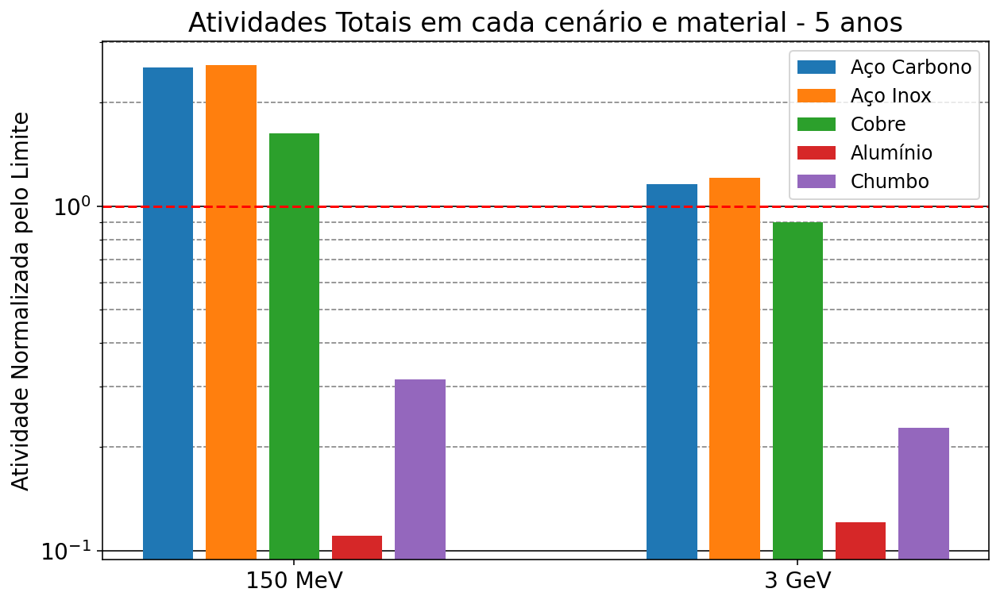

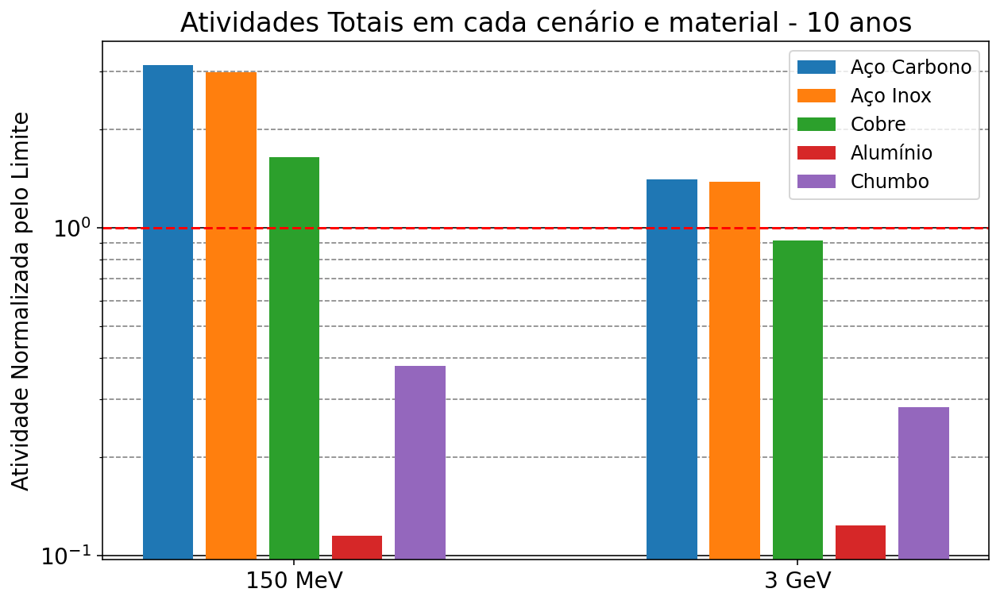

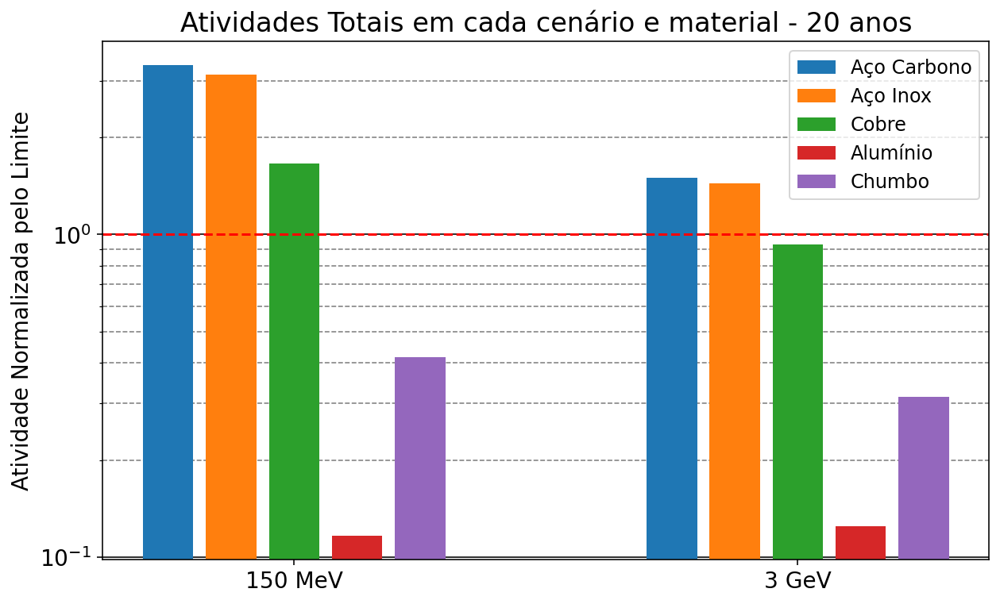

In [6]:
import matplotlib.pyplot as plt
import numpy as np
# Script para plotar as atividades totais de cada caso-material em gráficos separados pelo tempo
############################ Configurações Plot por tempo #############################################
casos_pastas = ['Linac_1', 'Lifetime_1']  # Pastas de cada caso
normal = 1
casos_norm = [4, 1/5]     # normalização de cada caso
casos = ['150 MeV', '3 GeV']    # labels de cada caso

materiais_pastas = ['/MAT1', '/MAT2', '/MAT3', '/MAT4', '/MAT5']                         # Pastas dos materiais que serão usados
materiais = ['Aço Carbono', 'Aço Inox', 'Cobre', 'Alumínio', 'Chumbo']               # nomes dos materiais na mesma ordem das pastas

tempos_pastas = ['/IRR1', '/IRR2', '/IRR3', '/IRR4', '/IRR5', '/IRR6']                           # Pastas dos tempos de irradiação
tempos = ['1 semana', '1 mês', '1 ano', '5 anos', '10 anos', '20 anos']   # nomes dos tempos na mesma ordem das pastas

highlights = ['H3', 'Tl202', 'O15', 'Na22', 'Mg23', 'Al26m', 'Si27', 'K38', 'Fe53']  # Elementos que aparecerão no ressaltados no plot
# highlights = []  # Se não quiser elementos ressaltados no plot, só deixar esse vetor vazio
minimo = 1e-3  # atividade mínima em bq para leitura
norm_lim = norm_lim  # Normalização com o limite
file_out = '/Act_Sirius.txt'              # Nome do arquivo em cada pasta com o compilado de atividade
direct = ''
###########################################################################################################

def plot_bar_tempo(tempo_j, larg, maxim, titulo, titulo_y):
    plt.rcParams.update({'font.size':14}) # tamanho da fonte dos graficos
    fig, ax = plt.subplots()
    x = np.arange(len(casos_pastas))

    quanti = len(materiais)
    width = larg/quanti
    meio = (1+quanti)/2
    for i in range(1,quanti+1):
        y = []
        for k, caso in enumerate(casos):
            y.append( atividades_dict[caso][tempo_j][i-1] )

        if meio == 1:
            dx = 0
        else:
            dx = maxim * (i- meio) / (meio-1)
        rects1 = ax.bar(x + dx*width*quanti, y, width, label=materiais[i-1])

    ax.legend(prop={'size': 12})

    ax.set_ylabel(titulo_y)
    ax.set_title(titulo)
    ax.set_xticks(x)
    # plt.xticks(rotation=-30)
    ax.set_xticklabels(casos)
    ax.yaxis.grid(b=True, which='major', color='black', linestyle='-')
    ax.yaxis.grid(b=True, which='minor', color='gray', linestyle='--')
    ax.set_axisbelow(True)
    plt.yscale('log')
    if norm_lim:
        plt.axhline(y=1, color='r', linestyle='--')
    # fig.tight_layout()
    ax.patch.set_facecolor('white')
    fig.patch.set_facecolor('white')
    # fig.patch.set_alpha(0)
    fig.set_size_inches(10, 6)
    plt.show()



for j, tempo in enumerate(tempos):
    if norm_lim:
        plot_bar_tempo(j, 0.5, 0.5, 'Atividades Totais em cada cenário e material - ' + tempo, 'Atividade Normalizada pelo Limite')
    else:
        plot_bar_tempo(j, 0.5, 0.5, 'Atividades Totais em cada cenário e material - ' + tempo, 'Atividade (Bq)')

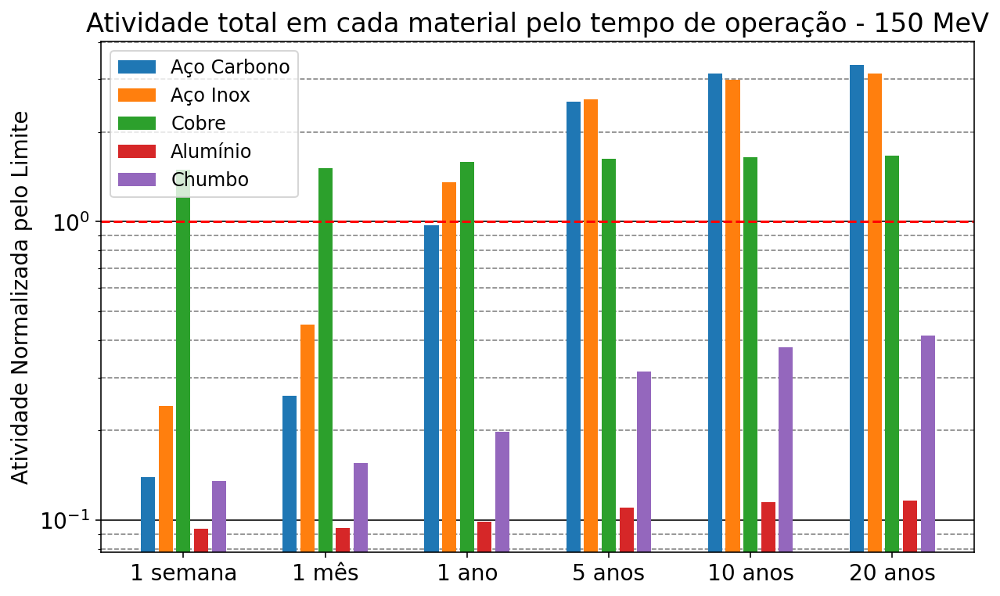

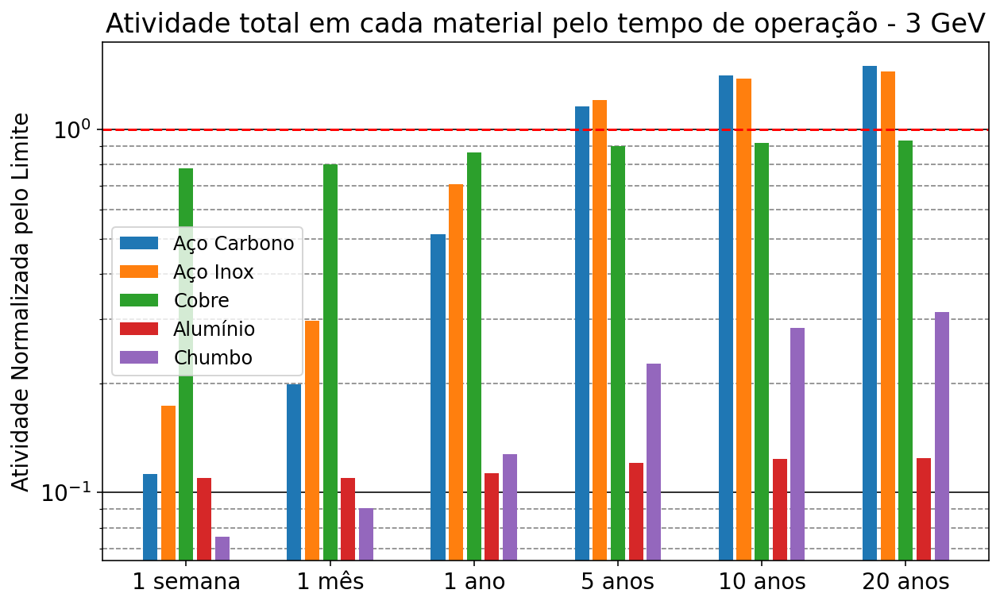

In [7]:
import matplotlib.pyplot as plt
import numpy as np
# Script para plotar as atividades totais de cada caso-material em gráficos separados pelo tempo
############################ Configurações Plot por tempo #############################################
casos_pastas = ['Linac_1', 'Lifetime_1']  # Pastas de cada caso
normal = 1
casos_norm = [4, 1/5]     # normalização de cada caso
casos = ['150 MeV', '3 GeV']    # labels de cada caso

materiais_pastas = ['/MAT1', '/MAT2', '/MAT3', '/MAT4', '/MAT5']                         # Pastas dos materiais que serão usados
materiais = ['Aço Carbono', 'Aço Inox', 'Cobre', 'Alumínio', 'Chumbo']               # nomes dos materiais na mesma ordem das pastas

tempos_pastas = ['/IRR1', '/IRR2', '/IRR3', '/IRR4', '/IRR5', '/IRR6']                           # Pastas dos tempos de irradiação
tempos = ['1 semana', '1 mês', '1 ano', '5 anos', '10 anos', '20 anos']   # nomes dos tempos na mesma ordem das pastas

minimo = 1e-3  # atividade mínima em bq para leitura
norm_lim = norm_lim  # Normalização com o limite
file_out = '/Act_Sirius.txt'              # Nome do arquivo em cada pasta com o compilado de atividade
direct = ''
###########################################################################################################

def plot_bar_caso(caso_i, larg, maxim, titulo, titulo_y):
    plt.rcParams.update({'font.size':14}) # tamanho da fonte dos graficos
    fig, ax = plt.subplots()
    x = np.arange(len(tempos_pastas))

    quanti = len(materiais)
    width = larg/quanti
    meio = (1+quanti)/2
    for i in range(1,quanti+1):
        y = []
        for j, tempo in enumerate(tempos):
            y.append( atividades_dict[casos[caso_i]][j][i-1] )

        if meio == 1:
            dx = 0
        else:
            dx = maxim * (i- meio) / (meio-1)
        rects1 = ax.bar(x + dx*width*quanti, y, width, label=materiais[i-1])

    ax.legend(prop={'size': 12})

    ax.set_ylabel(titulo_y)
    ax.set_title(titulo)
    ax.set_xticks(x)
    # plt.xticks(rotation=-30)
    ax.set_xticklabels(tempos)
    ax.yaxis.grid(b=True, which='major', color='black', linestyle='-')
    ax.yaxis.grid(b=True, which='minor', color='gray', linestyle='--')
    ax.set_axisbelow(True)
    plt.yscale('log')
    if norm_lim:
        plt.axhline(y=1, color='r', linestyle='--')
    # fig.tight_layout()
    ax.patch.set_facecolor('white')
    fig.patch.set_facecolor('white')
    # fig.patch.set_alpha(0)
    fig.set_size_inches(10, 6)
    plt.show()



for i, caso in enumerate(casos):
    if norm_lim:
        plot_bar_caso(i, 0.5, 0.5, 'Atividade total em cada material pelo tempo de operação - ' + caso, 'Atividade Normalizada pelo Limite')
    else:
        plot_bar_caso(i, 0.5, 0.5, 'Atividade total em cada material pelo tempo de operação - ' + caso, 'Atividade (Bq)')

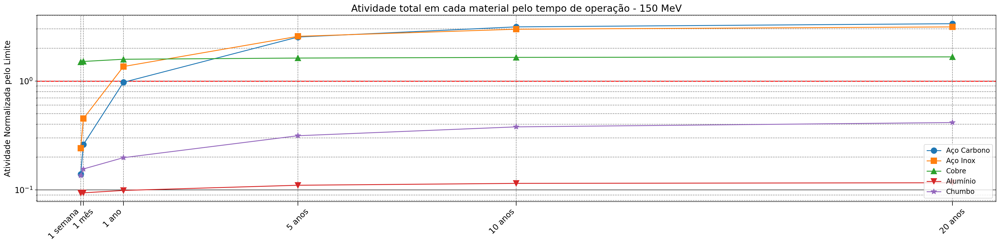

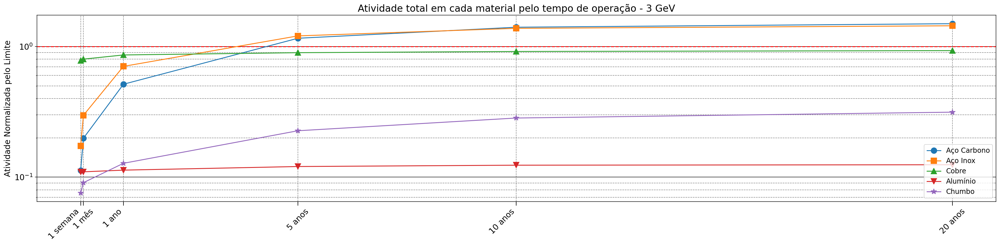

In [8]:
import matplotlib.pyplot as plt
from matplotlib.ticker import FixedLocator, FormatStrFormatter
import numpy as np
# Script para plotar as atividades totais de cada caso-material em gráficos separados pelo tempo
############################ Configurações Plot por tempo #############################################
casos_pastas = ['Linac_1', 'Lifetime_1']  # Pastas de cada caso
normal = 1
casos_norm = [4, 1/5]     # normalização de cada caso
casos = ['150 MeV', '3 GeV']    # labels de cada caso

materiais_pastas = ['/MAT1', '/MAT2', '/MAT3', '/MAT4', '/MAT5']                         # Pastas dos materiais que serão usados
materiais = ['Aço Carbono', 'Aço Inox', 'Cobre', 'Alumínio', 'Chumbo']               # nomes dos materiais na mesma ordem das pastas

tempos_pastas = ['/IRR1', '/IRR2', '/IRR3', '/IRR4', '/IRR5', '/IRR6']                           # Pastas dos tempos de irradiação
tempos = ['1 semana', '1 mês', '1 ano', '5 anos', '10 anos', '20 anos']   # nomes dos tempos na mesma ordem das pastas
tempos_reais = [1, 4.348, 52.177, 260.887, 521.77, 1043.55]   # nomes dos tempos na mesma ordem das pastas
# tempos_pastas = ['/IRR1', '/IRR2', '/IRR3', '/IRR4', '/IRR5']                           # Pastas dos tempos de irradiação
# tempos = ['1 semana', '1 mês', '1 ano', '5 anos', '10 anos']   # nomes dos tempos na mesma ordem das pastas
# tempos_reais = [1, 4.348, 52.177, 260.887, 521.77]   # nomes dos tempos na mesma ordem das pastas

minimo = 1e-3  # atividade mínima em bq para leitura
norm_lim = norm_lim  # Normalização com o limite
file_out = '/Act_Sirius.txt'              # Nome do arquivo em cada pasta com o compilado de atividade
direct = ''
markers = ['o', 's', '^', 'v', '*', '<', '>', 'p', 'd']  # Marcadores variando de circulos, quadrados, triangulos, tringulos pra baixo, estrelas, tringulos pra esquerda, tringulos pra direita, pentagonos e losangos
###########################################################################################################

def plot_bar_caso(caso_i, titulo, titulo_y):
    plt.rcParams.update({'font.size':14}) # tamanho da fonte dos graficos
    fig, ax = plt.subplots()
    x = np.array(tempos_reais)

    for k, material in enumerate(materiais):
        y = []
        yerr = []
        for j, tempo in enumerate(tempos):
            y.append( atividades_dict[casos[caso_i]][j][k] )
            yerr.append( atividadeserr_dict[casos[caso_i]][j][k]*atividades_dict[casos[caso_i]][j][k] )
            
#         plt.errorbar(x, y, yerr, marker = markers[k], markersize=10, label=material)
        plt.errorbar(x, y, marker = markers[k], markersize=10, label=material)

    ax.legend(prop={'size': 12})

    ax.set_ylabel(titulo_y)
    ax.set_title(titulo)
    
    ax.set_xticks(x[0::2])
    ax.set_xticks(x[1::2], minor=True)
    ax.set_xticklabels(tempos[0::2])
    ax.set_xticklabels(tempos[1::2], minor=True)
    ax.tick_params(axis='x', which='both', size=7, width=1)
#     ax.set_xticks(x)
    plt.xticks(rotation=45, ha='right')
    plt.setp(ax.xaxis.get_minorticklabels(), rotation=45, ha='center')
#     ax.set_xticklabels(tempos)
    ax.yaxis.grid(b=True, which='major', color='black', linestyle='-')
    ax.yaxis.grid(b=True, which='minor', color='gray', linestyle='--')
    ax.xaxis.grid(b=True, which='major', color='gray', linestyle='--')
    ax.xaxis.grid(b=True, which='minor', color='gray', linestyle='--')
    ax.set_axisbelow(True)
    plt.yscale('log')
    if norm_lim:
        plt.axhline(y=1, color='r', linestyle='--')
    # fig.tight_layout()
    ax.patch.set_facecolor('white')
    fig.patch.set_facecolor('white')
    # fig.patch.set_alpha(0)
    fig.set_size_inches(30, 6)
    plt.show()



for i, caso in enumerate(casos):
    if norm_lim:
        plot_bar_caso(i, 'Atividade total em cada material pelo tempo de operação - ' + caso, 'Atividade Normalizada pelo Limite')
    else:
        plot_bar_caso(i, 'Atividade total em cada material pelo tempo de operação - ' + caso, 'Atividade (Bq)')

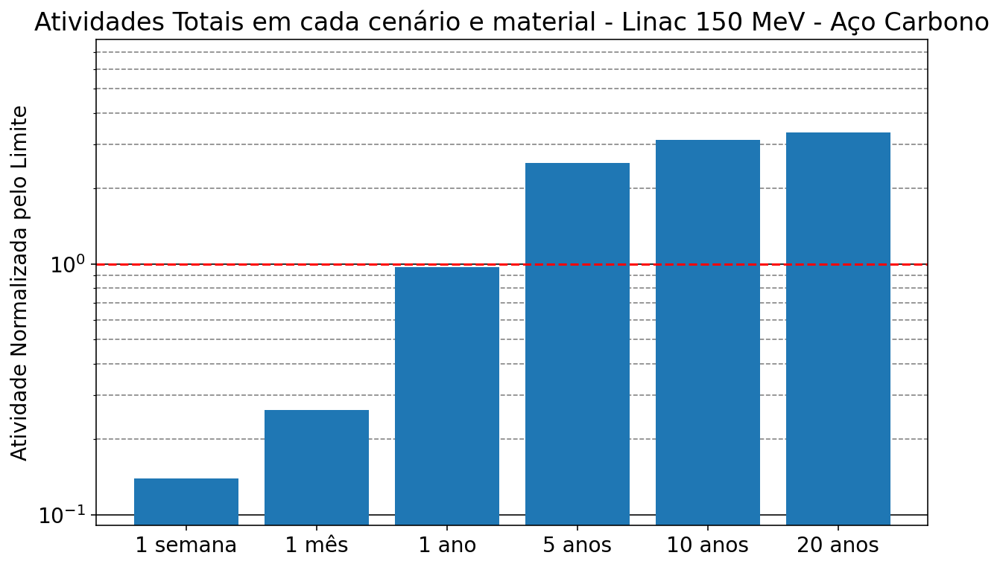

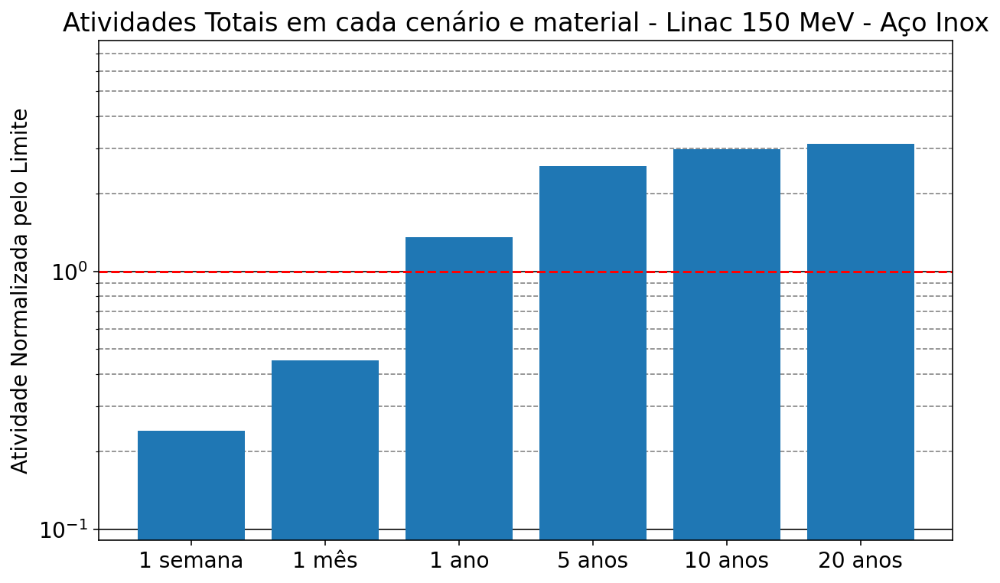

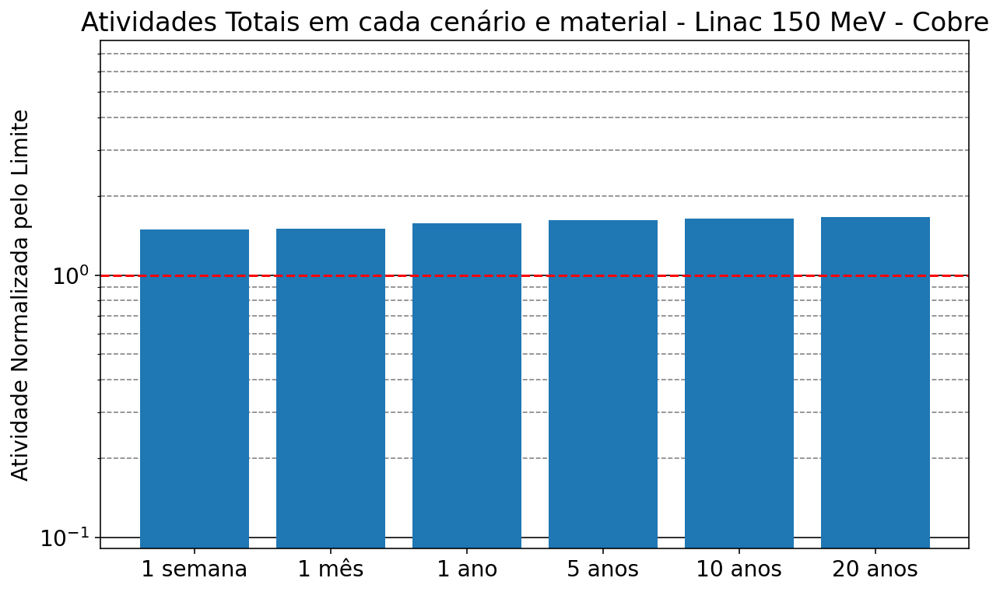

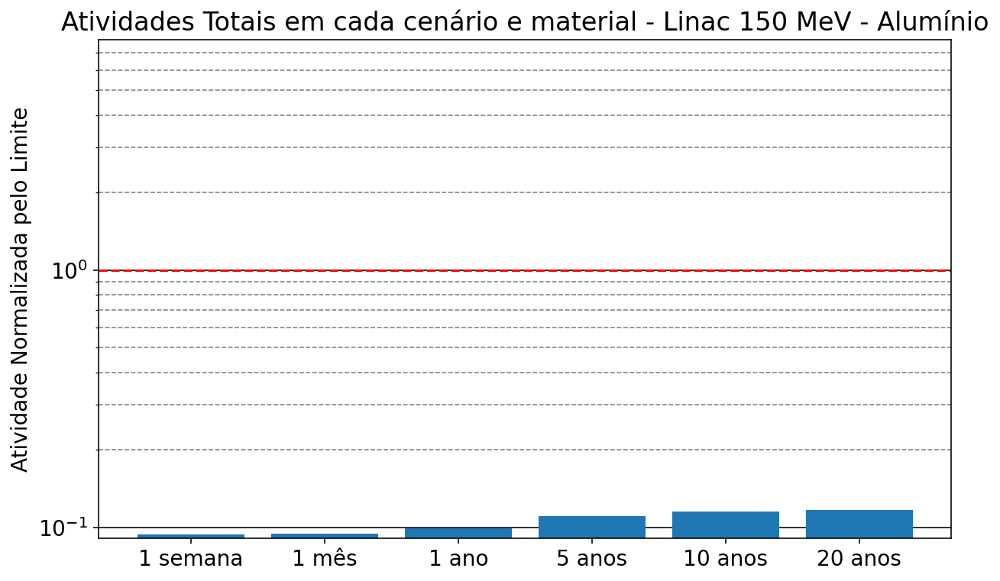

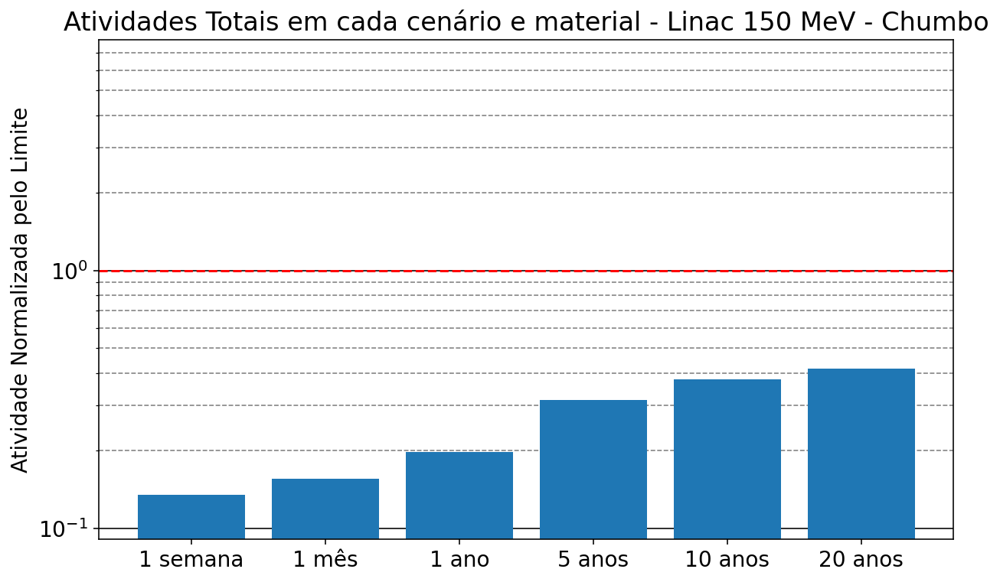

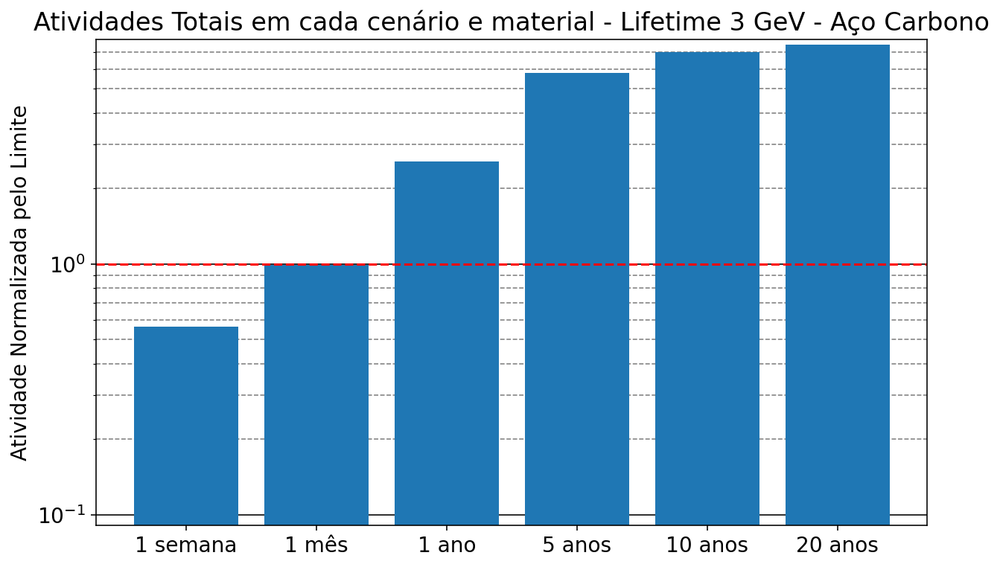

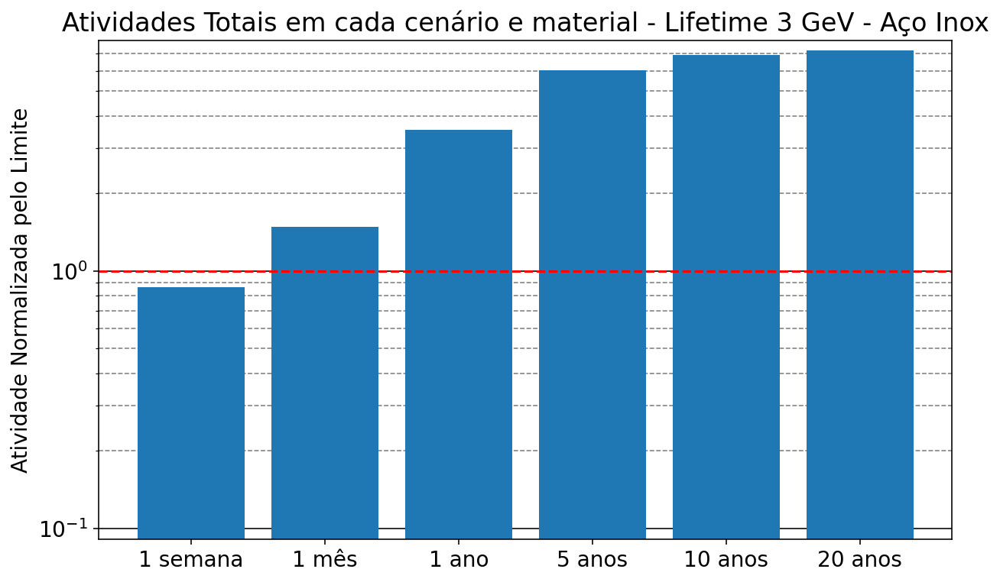

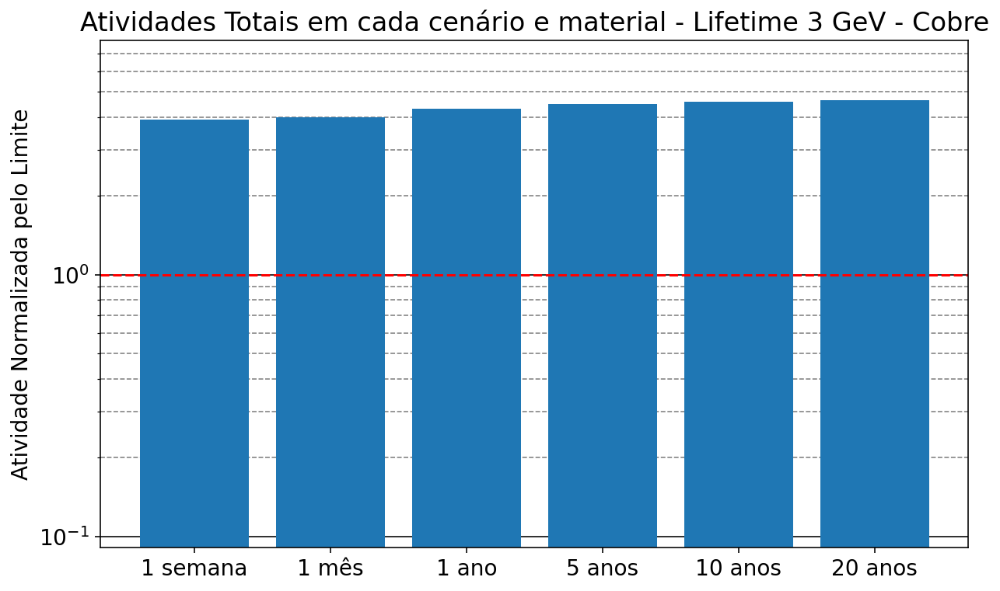

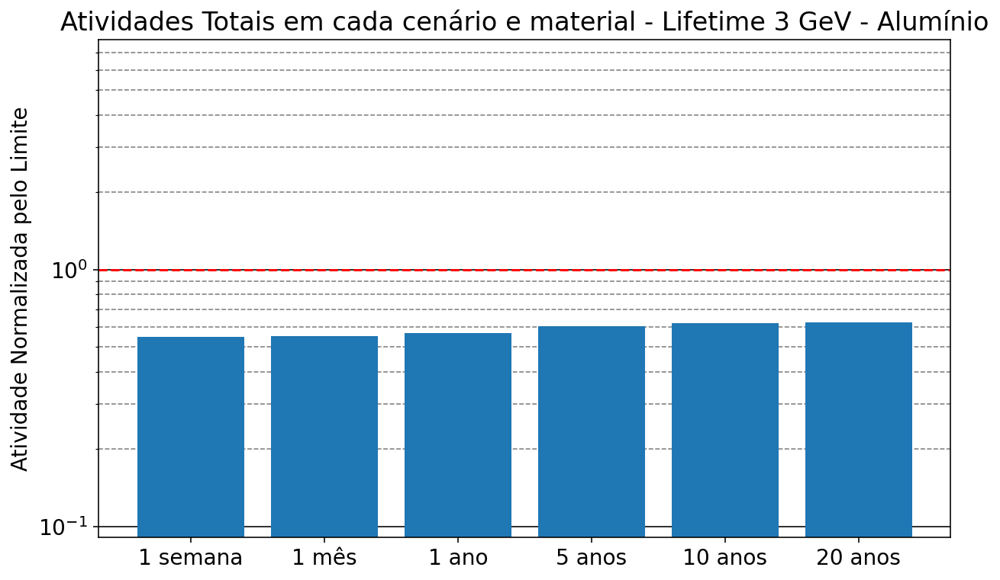

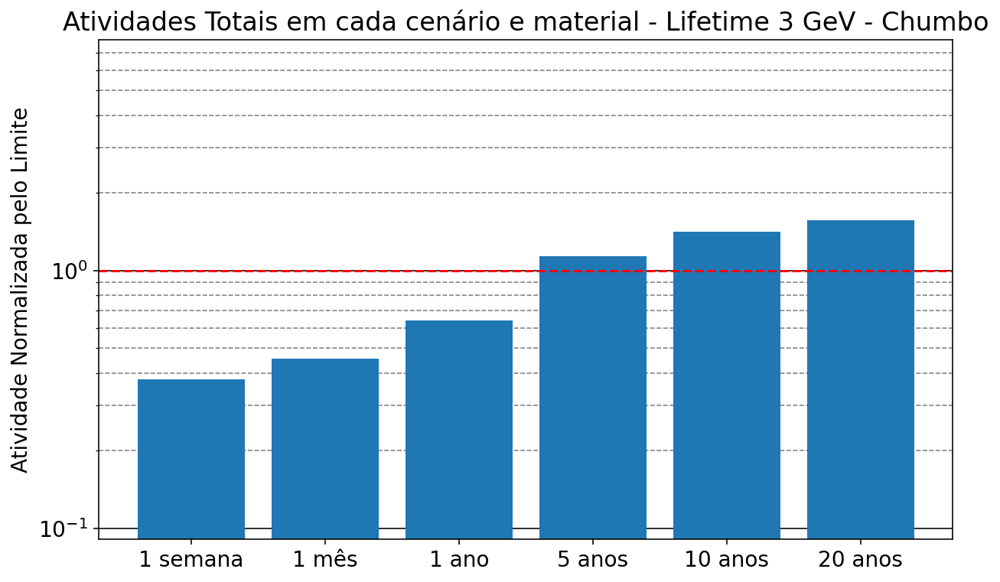

In [29]:
import matplotlib.pyplot as plt
import numpy as np
# Script para plotar as atividades totais de cada caso-material em gráficos separados pelo tempo
############################ Configurações Plot por tempo #############################################
casos_pastas = ['Linac_1', 'Lifetime_1']  # Pastas de cada caso
normal = 1
casos_norm = [4, 1]     # normalização de cada caso
casos = ['150 MeV', '3 GeV']    # labels de cada caso

materiais_pastas = ['/MAT1', '/MAT2', '/MAT3', '/MAT4', '/MAT5']                         # Pastas dos materiais que serão usados
materiais = ['Aço Carbono', 'Aço Inox', 'Cobre', 'Alumínio', 'Chumbo']               # nomes dos materiais na mesma ordem das pastas

tempos_pastas = ['/IRR1', '/IRR2', '/IRR3', '/IRR4', '/IRR5', '/IRR6']                           # Pastas dos tempos de irradiação
tempos = ['1 semana', '1 mês', '1 ano', '5 anos', '10 anos', '20 anos']   # nomes dos tempos na mesma ordem das pastas

highlights = ['H3', 'Tl202', 'O15', 'Na22', 'Mg23', 'Al26m', 'Si27', 'K38', 'Fe53']  # Elementos que aparecerão no ressaltados no plot
# highlights = []  # Se não quiser elementos ressaltados no plot, só deixar esse vetor vazio
minimo = 1e-3  # atividade mínima em bq para leitura
norm_lim = norm_lim  # Normalização com o limite
file_out = '/Act_Sirius.txt'              # Nome do arquivo em cada pasta com o compilado de atividade
direct = ''
###########################################################################################################

def plot_bar_por_tempo(caso, material_k, larg, maxim, titulo, titulo_y):
    plt.rcParams.update({'font.size':14}) # tamanho da fonte dos graficos
    fig, ax = plt.subplots()
    x = np.arange(len(tempos_pastas))

    y = []
    for tempo_j in range(len(tempos)):
        y.append( atividades_dict[caso][tempo_j][material_k] )

    rects1 = ax.bar(x, y)

    ax.set_ylabel(titulo_y)
    ax.set_title(titulo)
    ax.set_xticks(x)
    # plt.xticks(rotation=-30)
    ax.set_xticklabels(tempos)
    
    maior = max([atividade for c in atividades_dict.values() for t in c for atividade in t])*1.05
    menor = min([atividade for c in atividades_dict.values() for t in c for atividade in t])*0.97
    ax.set_ylim([menor,maior])
    
    ax.yaxis.grid(b=True, which='major', color='black', linestyle='-')
    ax.yaxis.grid(b=True, which='minor', color='gray', linestyle='--')
    ax.set_axisbelow(True)
    plt.yscale('log')
    # fig.tight_layout()
    ax.patch.set_facecolor('white')
    fig.patch.set_facecolor('white')
    # fig.patch.set_alpha(0)
    fig.set_size_inches(10, 6)
    
    if norm_lim:
        plt.axhline(y=1, color='r', linestyle='--')
    plt.show()



for i, caso in enumerate(casos):
    for k, material in enumerate(materiais):
        if norm_lim:
            plot_bar_por_tempo(caso, k, 0.5, 0.5, 'Atividades Totais em cada cenário e material - ' + caso + ' - ' + material, 'Atividade Normalizada pelo Limite')
        else:
            plot_bar_por_tempo(caso, k, 0.5, 0.5, 'Atividades Totais em cada cenário e material - ' + caso + ' - ' + material, 'Atividade (Bq)')

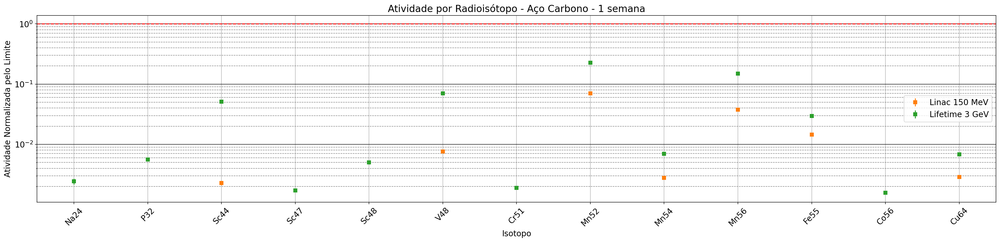

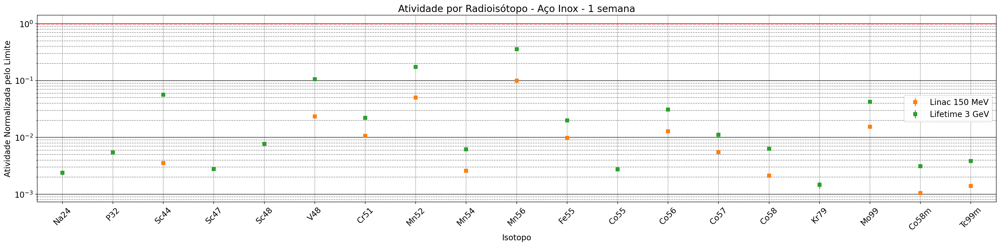

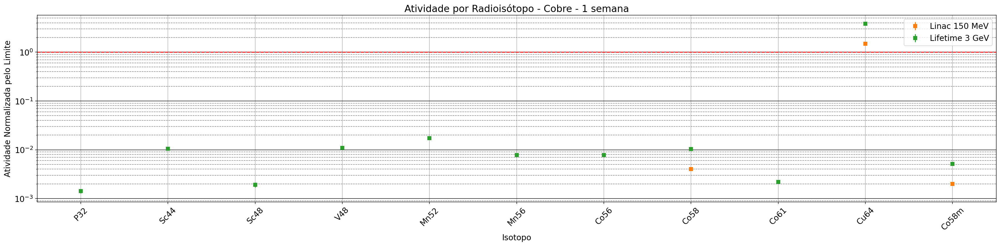

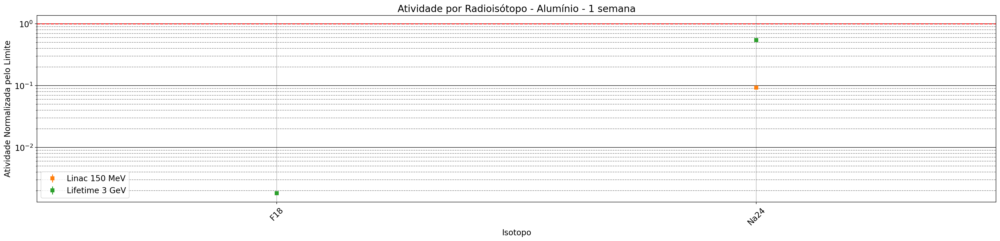

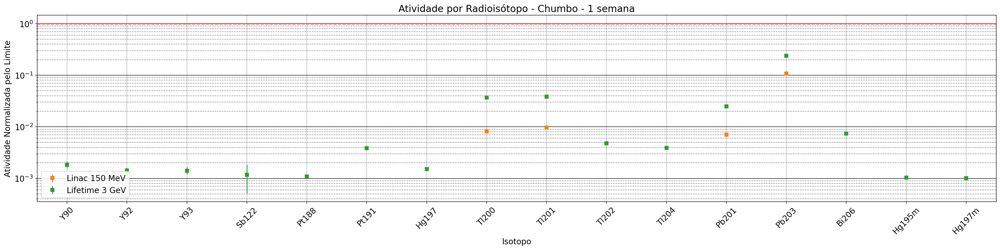

...

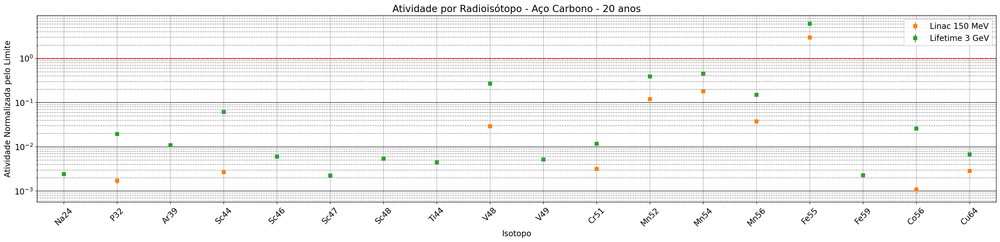

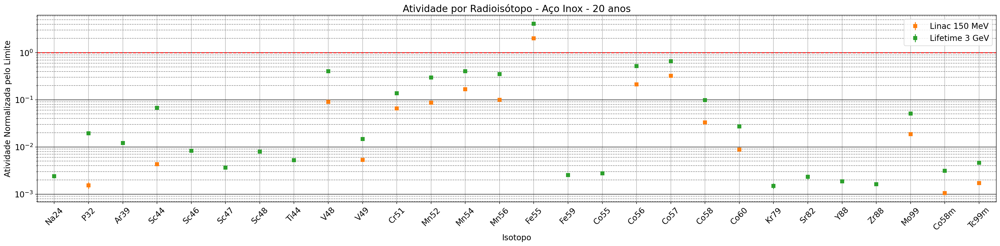

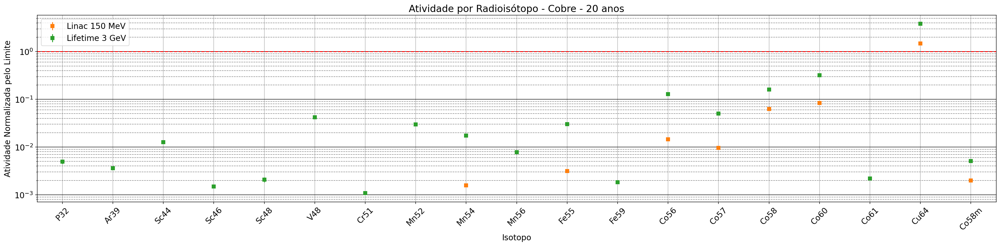

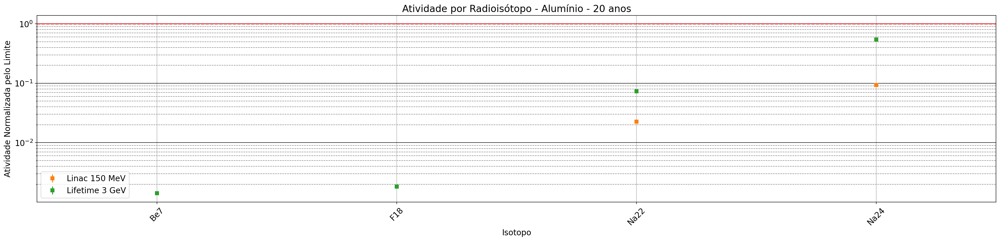

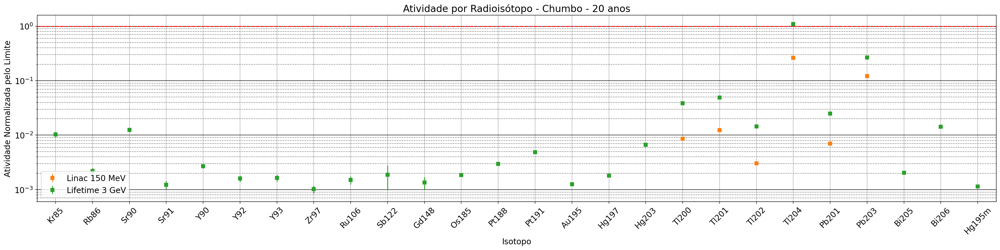

In [30]:
import matplotlib.pyplot as plt
import numpy as np
# Script para plotar as atividades totais de cada tempo-material em gráficos separados por casos
############################ Configurações Plot por caso #############################################
casos_pastas = ['Linac_1', 'Lifetime_1']  # Pastas de cada caso
normal = 1
casos_norm = [4, 1]     # normalização de cada caso
casos = ['150 MeV', '3 GeV']    # labels de cada caso

materiais_pastas = ['/MAT1', '/MAT2', '/MAT3', '/MAT4', '/MAT5']                         # Pastas dos materiais que serão usados
materiais = ['Aço Carbono', 'Aço Inox', 'Cobre', 'Alumínio', 'Chumbo']               # nomes dos materiais na mesma ordem das pastas

tempos_pastas = ['/IRR1', '/IRR2', '/IRR3', '/IRR4', '/IRR5', '/IRR6']                           # Pastas dos tempos de irradiação
tempos = ['1 semana', '1 mês', '1 ano', '5 anos', '10 anos', '20 anos']   # nomes dos tempos na mesma ordem das pastas

# highlights = ['H3', 'Tl202', 'O15', 'Na22', 'Mg23', 'Al26m', 'Si27', 'K38', 'Fe53']  # Elementos que aparecerão no ressaltados no plot
highlights = []  # Se não quiser elementos ressaltados no plot, só deixar esse vetor vazio
minimo = 1e-3                    # atividade mínima em bq para leitura
norm_lim = True
file_out = '/Act_Sirius.txt'  # Nome do arquivo em cada pasta com o compilado de atividade
direct = ''
###########################################################################################################



periodic = ['H',                                                                                                  'He',
            'Li', 'Be',                                                             'B',  'C',  'N',  'O',  'F',  'Ne',
            'Na', 'Mg',                                                             'Al', 'Si', 'P',  'S',  'Cl', 'Ar',
            'K',  'Ca', 'Sc', 'Ti', 'V',  'Cr', 'Mn', 'Fe', 'Co', 'Ni', 'Cu', 'Zn', 'Ga', 'Ge', 'As', 'Se', 'Br', 'Kr',
            'Rb', 'Sr', 'Y',  'Zr', 'Nb', 'Mo', 'Tc', 'Ru', 'Rh', 'Pd', 'Ag', 'Cd', 'In', 'Sn', 'Sb', 'Te', 'I',  'Xe',
            'Cs', 'Ba',
                 'La', 'Ce', 'Pr', 'Nd', 'Pm', 'Sm', 'Eu', 'Gd', 'Tb', 'Dy', 'Ho', 'Er', 'Tm', 'Yb',
                        'Lu', 'Hf', 'Ta', 'W',  'Re', 'Os', 'Ir', 'Pt', 'Au', 'Hg', 'Tl', 'Pb', 'Bi', 'Po', 'At', 'Rn',
            'Fr', 'Ra',
                 'Ac', 'Th', 'Pa', 'U',  'Np', 'Pu', 'Am', 'Cm', 'Bk', 'Cf', 'Es', 'Fm', 'Md', 'No',
                        'Lr', 'Rf', 'Db', 'Sg', 'Bh', 'Hs', 'Mt', 'Ds', 'Rg', 'Uub','Uut','Uuq','Uup','Uuh','Uus','Uuo']

def Ordem_isotopos(material_k, tempo_j):  # Função para ordenar os isótopos
    isotopos = []
    for caso_i in range(len(casos_pastas)):
        pasta = direct + casos_pastas[caso_i] + tempos_pastas[tempo_j] + materiais_pastas[material_k]
        f = open(pasta + file_out)
        f.seek(0)
        lines=f.readlines()
        for line in lines[2:]:
            activity_data = float(line.split()[3].replace(',','.'))
            isotope_data = line.split()[0]
            if activity_data > minimo and isotope_data not in isotopos:
                isotopos.append(isotope_data)
    ordem = 0
    for m in ['', 'm']:
        for Z in periodic:
            for A in range(0, 300):
                iso = Z + str(A) + m
                if iso in isotopos:
                    indice = isotopos.index(iso)
                    popi = isotopos.pop(indice)
                    isotopos = isotopos[:ordem] + [popi] + isotopos[ordem:]
                    ordem += 1
                    if ordem > len(isotopos):
                        break
            if ordem > len(isotopos):
                break
        if ordem > len(isotopos):
            break
    return isotopos
                        
                    
    

def plot_elements_caso(material_k, tempo_j, minimo, highlights, y_titulo):
    material = materiais[material_k]
    fig, ax = plt.subplots()
    ax.patch.set_facecolor('white')
    fig.patch.set_facecolor('white')
    # fig.patch.set_alpha(0)
    fig.set_size_inches(30, 6)
    
    # Plot de todos os isótopos para manter a ordem
    isotopos = Ordem_isotopos(material_k, tempo_j)
    plt.errorbar(isotopos, [0]*len(isotopos), linestyle='None', marker='.', picker=True)
    
    for caso_i in range(len(casos_pastas)):
        pasta = direct + casos_pastas[caso_i] + tempos_pastas[tempo_j] + materiais_pastas[material_k]
        radioisotope = []
        activity = []
        error = []
        f = open(pasta + file_out)
        f.seek(0)
        lines=f.readlines()
        for line in lines[2:]:
            activity_data = float(line.split()[3].replace(',','.'))
            error_data = float(line.split()[4].replace(',','.'))
            if activity_data > minimo:
                activity.append(activity_data)
                error.append(activity_data * error_data / 100)
                radioisotope.append(line.split()[0])
                if radioisotope[-1] in highlights:
                    print(str(material) + ' - ' + str(tempos[tempo_j]) + ' --- ' +radioisotope[-1] + '\t' + str('{:.2E}'.format(activity[-1])).replace('.',','))

        plt.errorbar(radioisotope, activity, error, linestyle='None', marker='s', label = casos[caso_i], picker=True)  # para atividade total
    
    # Remoção do plot com todos os isótopos para manter a ordem
    line = plt.gca().get_lines().pop(0)
    line.remove()
    
    plt.grid(True)
    ax.yaxis.grid(b=True, which='major', color='black', linestyle='-')
    ax.yaxis.grid(b=True, which='minor', color='gray', linestyle='--')
    ax.set_axisbelow(True)
    plt.yscale('log')
    plt.xlabel('Isotopo')
    plt.ylabel(y_titulo)
            
    xmin = min( [ xyi[0] for line in plt.gca().get_lines() for xyi in line.get_xydata() ] )
    xmax = max( [ xyi[0] for line in plt.gca().get_lines() for xyi in line.get_xydata() ] )
    plt.xlim(xmin-0.5,xmax+0.5)
    plt.xticks(rotation = 45)
    plt.legend()
    plt.title('Atividade por Radioisótopo - ' + str(material) + ' - ' + str(tempos[tempo_j]))
    
    media = {}
    for iso in isotopos:
        media[iso] = 0
    for caso_i in range(len(casos_pastas)):
        yvalues = ax.lines[caso_i].get_ydata()
        xvalues = ax.lines[caso_i].get_xdata()
        for i, x in enumerate(xvalues):
            media[x] += np.log10(yvalues[i])
    for media_i in media:
        count = 0
        for caso_i in range(len(casos_pastas)):
            if media_i in ax.lines[caso_i].get_xdata():
                count += 1
        media[media_i] = 10**(media[media_i]/count)

    # # Para anorta o label em cada radioisótopo que tiver na lista highlights
    for i, txt in enumerate(media):
        if txt in highlights:
            # ax.annotate( txt, (i, media[list(media.keys())[i]]), rotation=0, color='black', alpha=0.8, fontsize=12)  # Ao lado da média
            ax.annotate( txt, (i, media[list(media.keys())[i]]), rotation=0, color='black', alpha=0.8, fontsize=12, ha='center') # Centralizado na média

    # # Para escrever radioisótopos onde você clicar no plot ( Não funciona no cocalc =/ )
    # def on_click(event):
    #     print(list(media.keys())[int(round(event.xdata,0))], event.ydata)
    #     ax.annotate( list(media.keys())[int(round(event.xdata,0))], (event.xdata, event.ydata), rotation=0)
    #     plt.draw()
    # fig.canvas.mpl_connect('button_press_event', on_click)
    
    # Linha vermelha no y = 1 
    if norm_lim:
        plt.axhline(y=1, color='r', linestyle='--')

    plt.show()
    
    
for tempo_j in range(len(tempos)):
    for material_k in range(len(materiais)):
        if norm_lim:
            plot_elements_caso(material_k, tempo_j, minimo, highlights, 'Atividade Normalizada pelo Limite')
        else:
            plot_elements_caso(material_k, tempo_j, minimo, highlights, 'Atividade (Bq)')

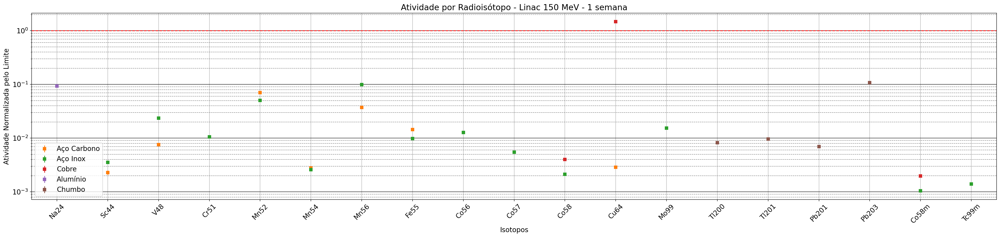

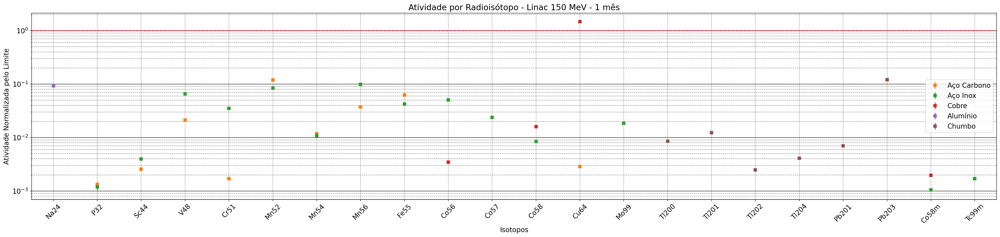

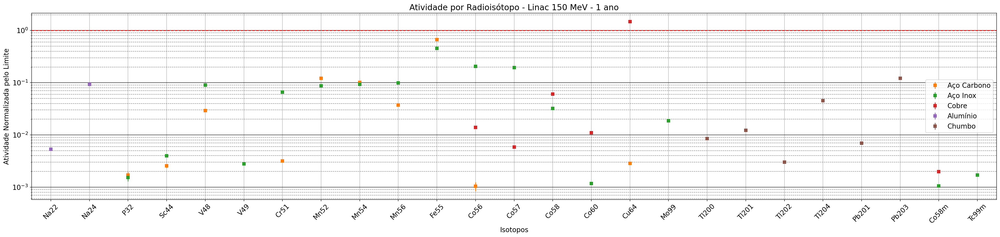

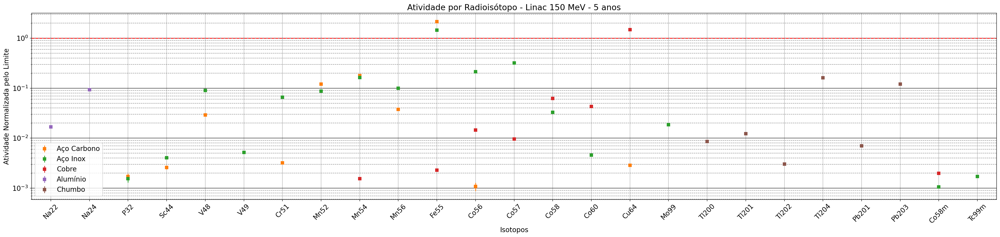

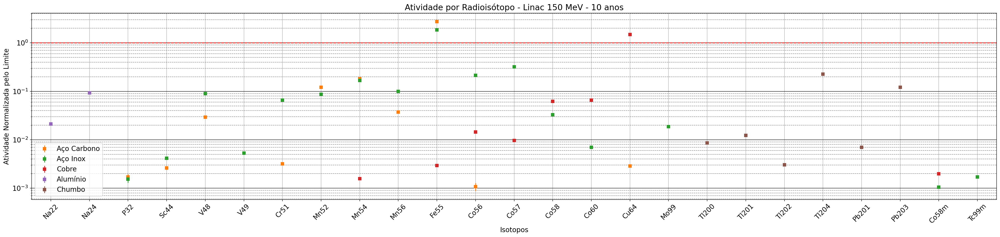

...

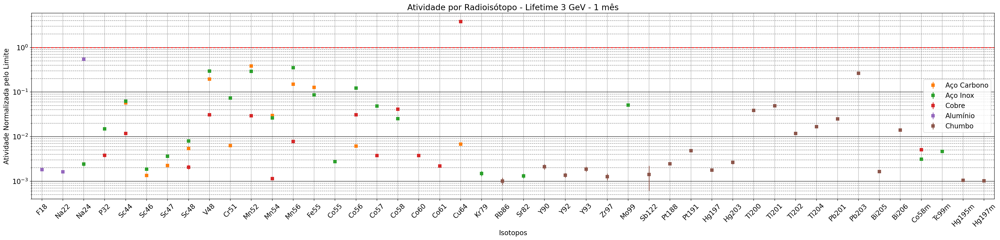

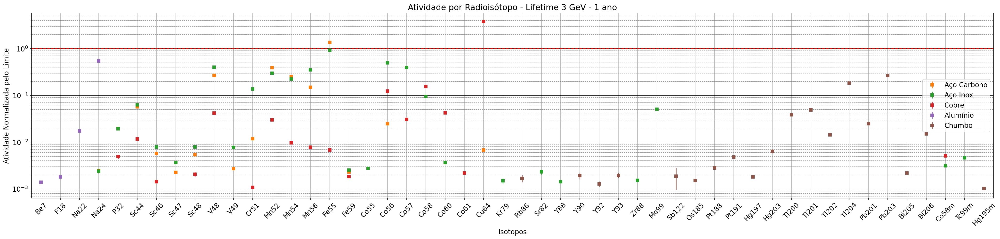

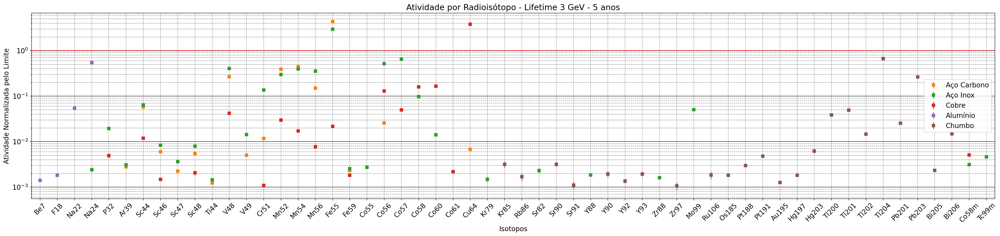

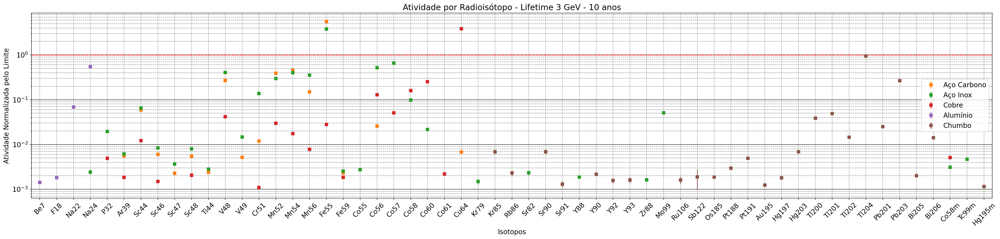

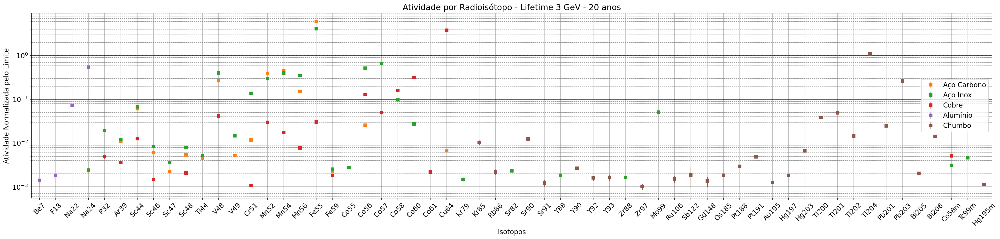

In [31]:
import matplotlib.pyplot as plt
import numpy as np
# Script para plotar as atividades totais de cada caso-material em gráficos separados pelo tempo
############################ Configurações Plot elementos por material ####################################
casos_pastas = ['Linac_1', 'Lifetime_1']  # Pastas de cada caso
normal = 1
casos_norm = [4, 1]     # normalização de cada caso
casos = ['150 MeV', '3 GeV']    # labels de cada caso

materiais_pastas = ['/MAT1', '/MAT2', '/MAT3', '/MAT4', '/MAT5']                         # Pastas dos materiais que serão usados
materiais = ['Aço Carbono', 'Aço Inox', 'Cobre', 'Alumínio', 'Chumbo']               # nomes dos materiais na mesma ordem das pastas

tempos_pastas = ['/IRR1', '/IRR2', '/IRR3', '/IRR4', '/IRR5', '/IRR6']                           # Pastas dos tempos de irradiação
tempos = ['1 semana', '1 mês', '1 ano', '5 anos', '10 anos', '20 anos']   # nomes dos tempos na mesma ordem das pastas

# highlights = ['H3', 'Tl202', 'O15', 'Na22', 'Mg23', 'Al26m', 'Si27', 'K38', 'Fe53']  # Elementos que aparecerão no ressaltados no plot
# highlights = ['C11', 'O15', 'Na22', 'Mg23', 'Al26m', 'Si27', 'K38', 'Fe53']   # Concreto Linac UVX
highlights = []  # Se não quiser elementos ressaltados no plot, só deixar esse vetor vazio
minimo = 1e-3                   # atividade mínima em bq para leitura
norm_lim = norm_lim
file_out = '/Act_Sirius.txt'  # Nome do arquivo em cada pasta com o compilado de atividade
direct = ''
###########################################################################################################


periodic = ['H',                                                                                                  'He',
            'Li', 'Be',                                                             'B',  'C',  'N',  'O',  'F',  'Ne',
            'Na', 'Mg',                                                             'Al', 'Si', 'P',  'S',  'Cl', 'Ar',
            'K',  'Ca', 'Sc', 'Ti', 'V',  'Cr', 'Mn', 'Fe', 'Co', 'Ni', 'Cu', 'Zn', 'Ga', 'Ge', 'As', 'Se', 'Br', 'Kr',
            'Rb', 'Sr', 'Y',  'Zr', 'Nb', 'Mo', 'Tc', 'Ru', 'Rh', 'Pd', 'Ag', 'Cd', 'In', 'Sn', 'Sb', 'Te', 'I',  'Xe',
            'Cs', 'Ba',
                 'La', 'Ce', 'Pr', 'Nd', 'Pm', 'Sm', 'Eu', 'Gd', 'Tb', 'Dy', 'Ho', 'Er', 'Tm', 'Yb',
                        'Lu', 'Hf', 'Ta', 'W',  'Re', 'Os', 'Ir', 'Pt', 'Au', 'Hg', 'Tl', 'Pb', 'Bi', 'Po', 'At', 'Rn',
            'Fr', 'Ra',
                 'Ac', 'Th', 'Pa', 'U',  'Np', 'Pu', 'Am', 'Cm', 'Bk', 'Cf', 'Es', 'Fm', 'Md', 'No',
                        'Lr', 'Rf', 'Db', 'Sg', 'Bh', 'Hs', 'Mt', 'Ds', 'Rg', 'Uub','Uut','Uuq','Uup','Uuh','Uus','Uuo']

def Ordem_isotopos(caso_i, tempo_j):  # Função para ordenar os isótopos
    isotopos = []
    for material_k in range(len(materiais_pastas)):
        pasta = direct + casos_pastas[caso_i] + tempos_pastas[tempo_j] + materiais_pastas[material_k]
        f = open(pasta + file_out)
        f.seek(0)
        lines=f.readlines()
        for line in lines[2:]:
            activity_data = float(line.split()[3].replace(',','.'))
            isotope_data = line.split()[0]
            if activity_data > minimo and isotope_data not in isotopos:
                isotopos.append(isotope_data)
    ordem = 0
    for m in ['', 'm']:
        for Z in periodic:
            for A in range(0, 300):
                iso = Z + str(A) + m
                if iso in isotopos:
                    indice = isotopos.index(iso)
                    popi = isotopos.pop(indice)
                    isotopos = isotopos[:ordem] + [popi] + isotopos[ordem:]
                    ordem += 1
                    if ordem > len(isotopos):
                        break
            if ordem > len(isotopos):
                break
        if ordem > len(isotopos):
            break
    return isotopos
                        
def plot_elements_material(caso_i, tempo_j, minimo, highlights, y_titulo):
    caso = casos[caso_i]
    fig, ax = plt.subplots()
    fig.tight_layout()
    ax.patch.set_facecolor('white')
    fig.patch.set_facecolor('white')
    # fig.patch.set_alpha(0)
    fig.set_size_inches(30, 6)
    
    # Plot de todos os isótopos para manter a ordem
    isotopos = Ordem_isotopos(caso_i, tempo_j)
    plt.errorbar(isotopos, [0]*len(isotopos), linestyle='None', marker='.', picker=True)
    
    for material_k in range(len(materiais)):
        pasta = direct + casos_pastas[caso_i] + tempos_pastas[tempo_j] + materiais_pastas[material_k]
        radioisotope = []
        activity = []
        error = []
        f = open(pasta + file_out)
        f.seek(0)
        lines=f.readlines()
        for line in lines[2:]:
            activity_data = float(line.split()[3].replace(',','.'))
            error_data = float(line.split()[4].replace(',','.'))
            if activity_data > minimo:
                activity.append(activity_data)
                error.append(activity_data * error_data / 100)
                radioisotope.append(line.split()[0])
                if radioisotope[-1] in highlights:
                    print(radioisotope[-1] + '\t' + str('{:.2E}'.format(activity[-1])).replace('.',','))

        plt.errorbar(radioisotope, activity, error, linestyle='None', marker='s', label = materiais[material_k], picker=True)  # para atividade total
        
    # Remoção do plot com todos os isótopos para manter a ordem
    line = plt.gca().get_lines().pop(0)
    line.remove()
    
    plt.grid(True)
    ax.yaxis.grid(b=True, which='major', color='black', linestyle='-')
    ax.yaxis.grid(b=True, which='minor', color='gray', linestyle='--')
    ax.set_axisbelow(True)
    plt.yscale('log')
    plt.xlabel('Isotopos')
    plt.ylabel(y_titulo)  # para atividade total
    xmin = min( [ xyi[0] for line in plt.gca().get_lines() for xyi in line.get_xydata() ] )
    xmax = max( [ xyi[0] for line in plt.gca().get_lines() for xyi in line.get_xydata() ] )
    plt.xlim(xmin-0.5,xmax+0.5)
    plt.xticks(rotation = 45)
    plt.legend()
    plt.title('Atividade por Radioisótopo - ' + str(caso) + ' - ' + str(tempos[tempo_j]))
    plt.legend()
    
    media = {}
    for iso in isotopos:
        media[iso] = 0
    for caso_i in range(len(casos_pastas)):
        yvalues = ax.lines[caso_i].get_ydata()
        xvalues = ax.lines[caso_i].get_xdata()
        for i, x in enumerate(xvalues):
            media[x] += np.log10(yvalues[i])
    for media_i in media:
        count = 0
        for material_k in range(len(materiais)):
            if media_i in ax.lines[material_k].get_xdata():
                count += 1
        media[media_i] = 10**(media[media_i]/count)

    # # Para anorta o label em cada radioisótopo que tiver na lista highlights
    for i, txt in enumerate(media):
        if txt in highlights:
            # ax.annotate( txt, (i, media[list(media.keys())[i]]), rotation=0, color='black', alpha=0.8, fontsize=12)  # Ao lado da média
            ax.annotate( txt, (i, media[list(media.keys())[i]]), rotation=0, color='black', alpha=0.8, fontsize=12, ha='center') # Centralizado na média

    # # Para escrever radioisótopos onde você clicar no plot ( Não funciona no cocalc =/ )
    # def on_click(event):
    #     print(list(media.keys())[int(round(event.xdata,0))], event.ydata)
    #     ax.annotate( list(media.keys())[int(round(event.xdata,0))], (event.xdata, event.ydata), rotation=0)
    #     plt.draw()
    # fig.canvas.mpl_connect('button_press_event', on_click)
    
    # Linha vermelha no y = 1 
    if norm_lim:
        plt.axhline(y=1, color='r', linestyle='--')

    plt.show()

# for material_i in range(len(materiais)):
#     plot_elements(material_i, '', 'UVX.txt', 1e-10)

for caso_i in range(len(casos)):
    for tempo_j in range(len(tempos)):
        if norm_lim:
            plot_elements_material(caso_i, tempo_j, minimo, highlights, 'Atividade Normalizada pelo Limite')
        else:
            plot_elements_material(caso_i, tempo_j, minimo, highlights, 'Atividade (Bq)')

         2
0.01044 x - 0.03163 x + 0.0277
0.010444834601831545 -0.03163288135200057 0.027700702135167506
0.0019385549172447555 0.0013109082323996906 0.0001844691676234884
-12.310446788302748 2.279040558310565


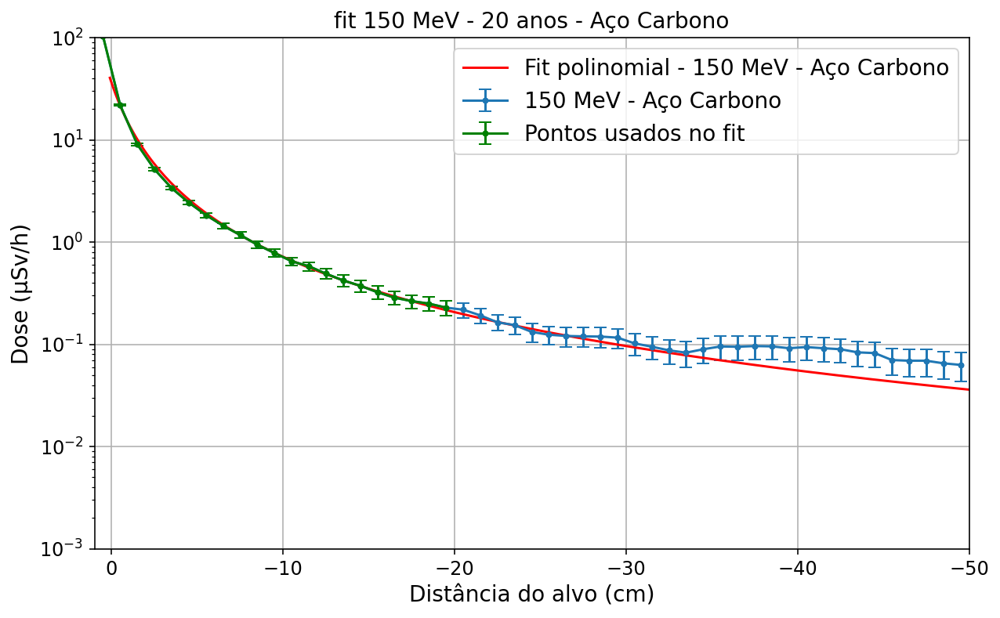

          2
0.005779 x - 0.01802 x + 0.01577
0.0057789807470713765 -0.01802234431405629 0.015765706719762115
0.001692204207985291 0.0011284371296412462 0.00015087754410621418
-17.035996452922973 4.981627698722753


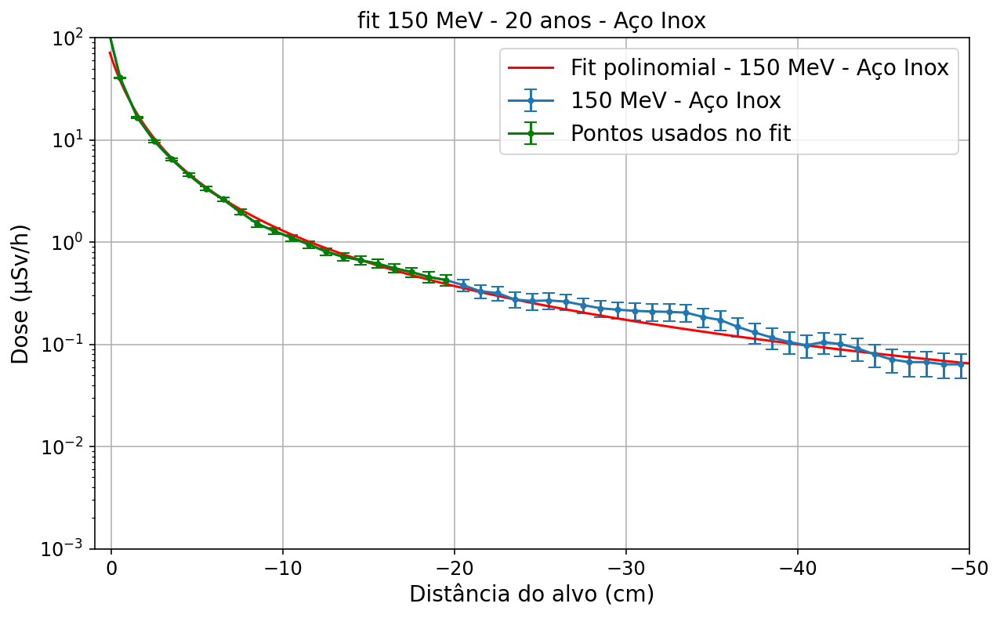

          2
0.006933 x - 0.02154 x + 0.0185
0.006932523454455801 -0.021540968484975425 0.018498656926659852
0.0020847475963117527 0.001449044376686654 0.00019970164546481405
-15.424032575922244 4.630706619045639


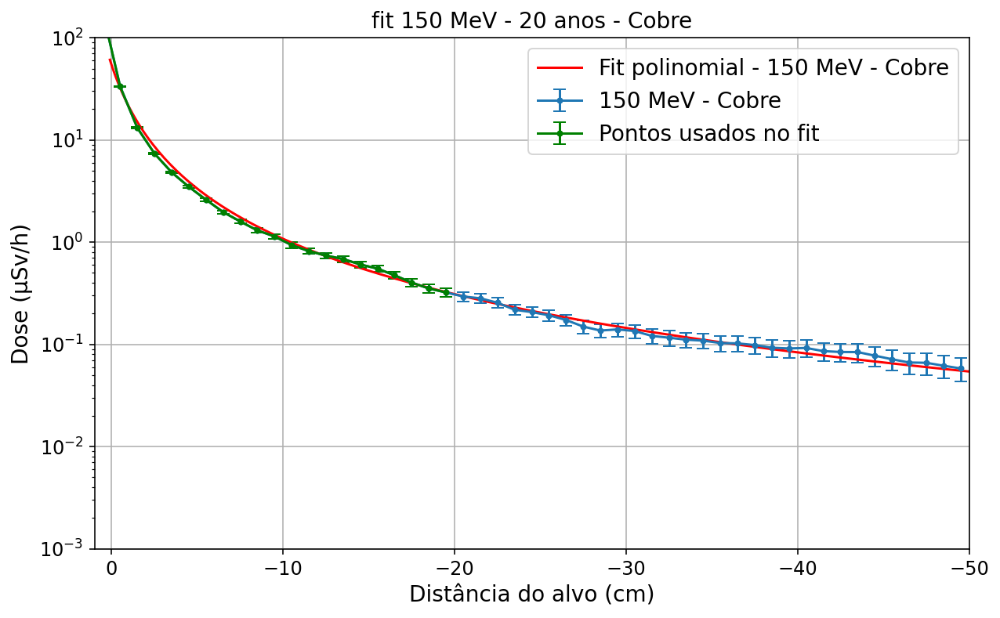

         2
0.01475 x - 0.475 x + 0.7246
0.01474570665860373 -0.4749869536637422 0.724616104143243
0.07043458909062744 0.04384655004130629 0.003835999860640834
-2.4922636820731485 11.87371552362177


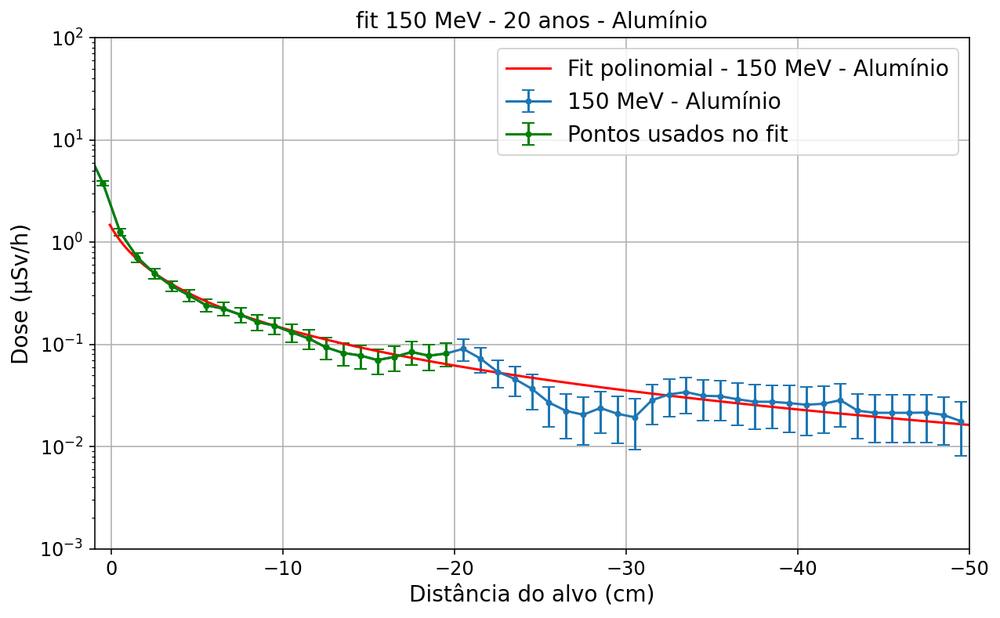

         2
0.05189 x - 0.0955 x + 0.04046
0.05189343724672133 -0.09549762263184135 0.04046083064031216
0.00693387322532517 0.0056752429174286405 0.0009910146214461798
-5.293359071284626 0.6986446997733191


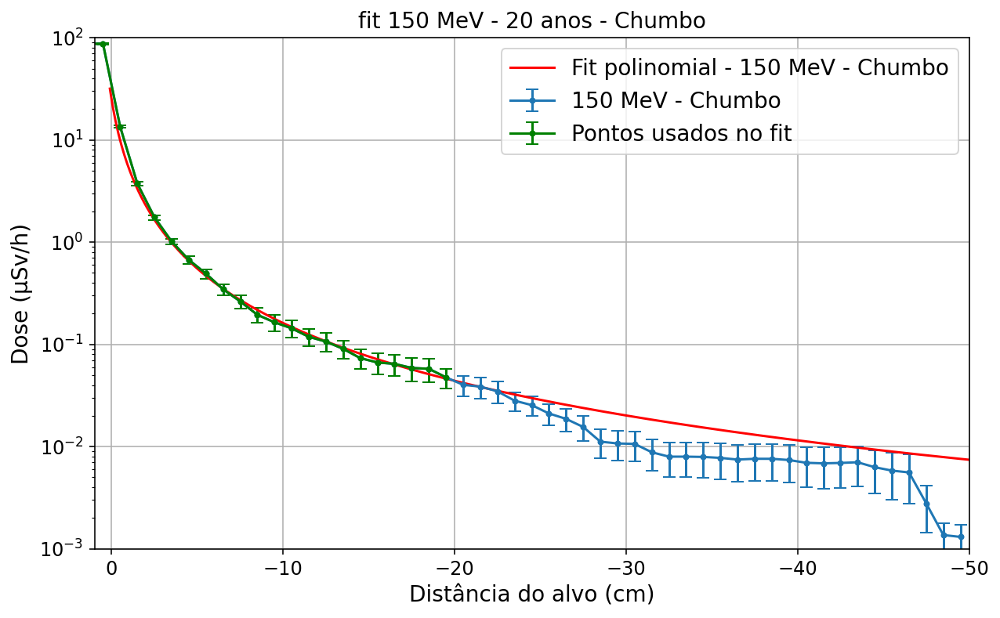

          2
0.006284 x - 0.04415 x + 0.05522
0.006283723814502897 -0.04414659870353386 0.05522387962765392
0.00545040676297614 0.003569418753322276 0.0003856128280256187
-14.42695283456339 12.493378041535312


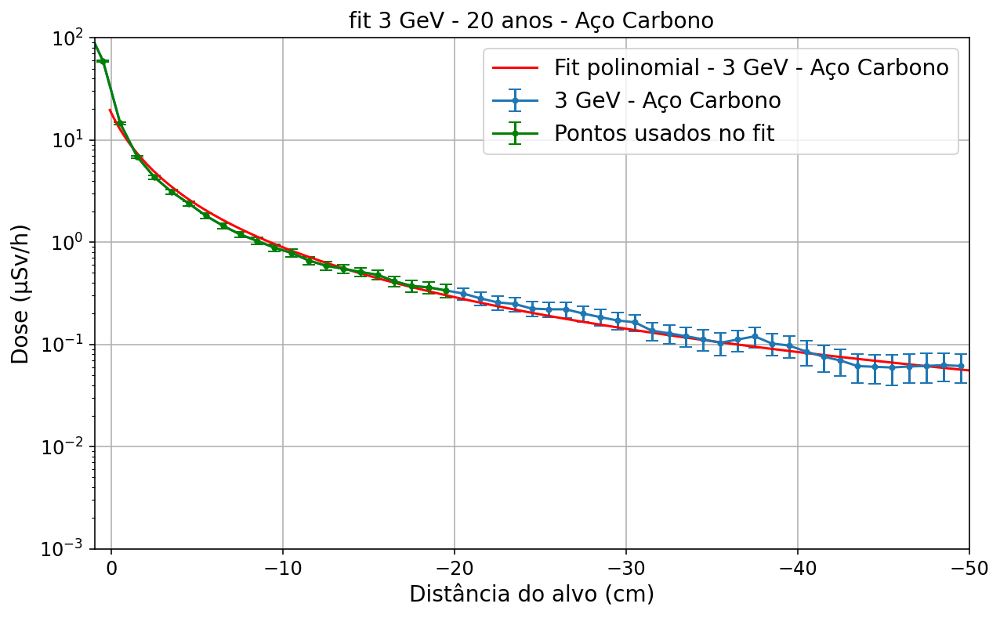

          2
0.005394 x - 0.02982 x + 0.03524
0.0053939499085484234 -0.02981862451327928 0.03524120470473854
0.0028587469237808137 0.0019073026932797151 0.00021566596943210583
-16.52043305366675 8.7439535138323


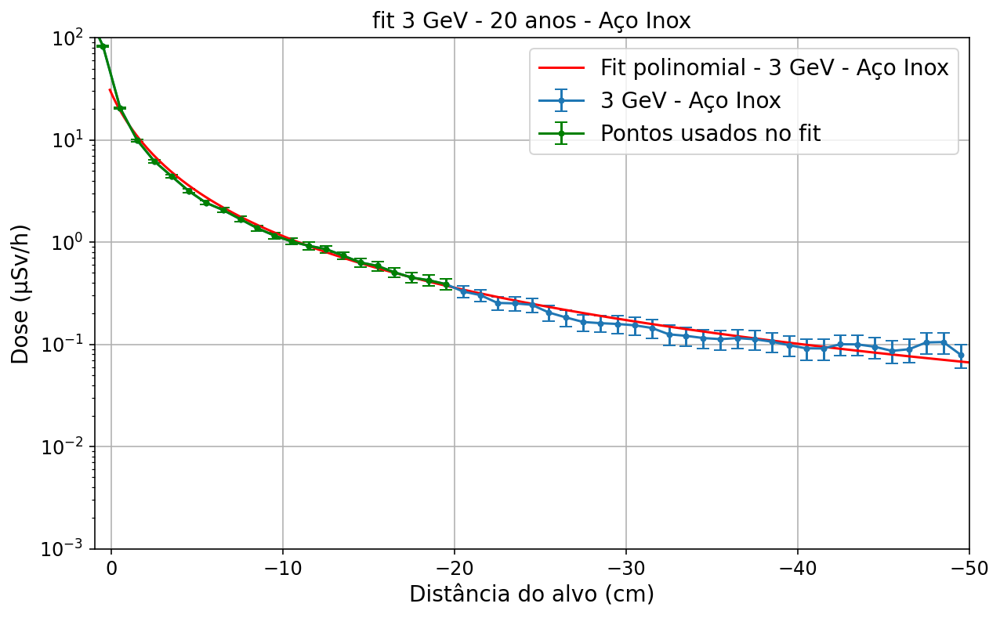

          2
0.007583 x - 0.03903 x + 0.04396
0.0075827115293051655 -0.03902796219431596 0.04395611148104542
0.004232028301834606 0.002758995066971739 0.0003281097260419015
-13.692549496860538 7.627373165963096


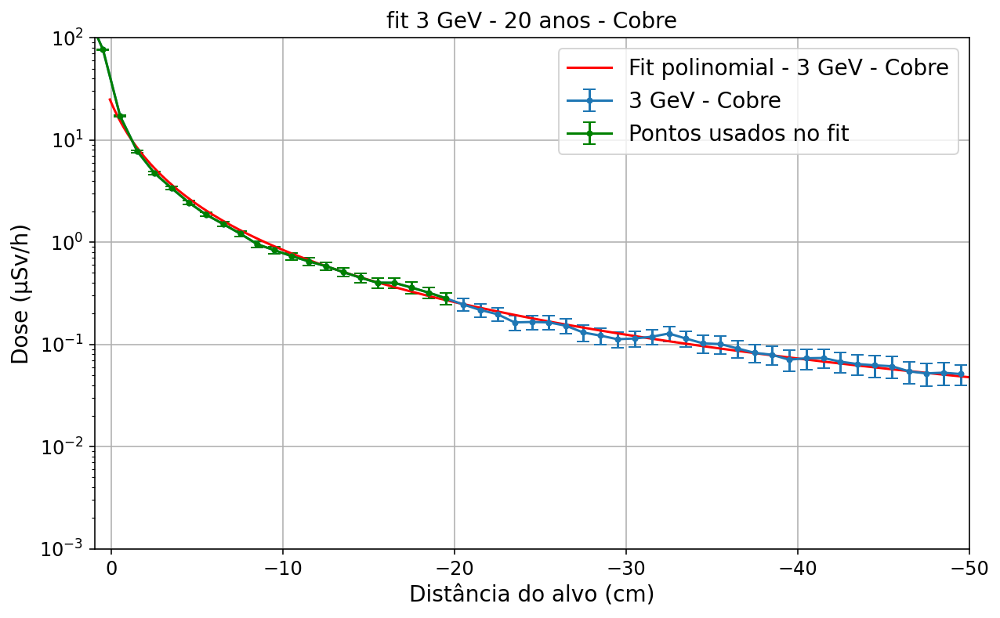

          2
0.008711 x - 0.5288 x + 0.9233
0.008710597029805247 -0.5288407700858686 0.9232988936797364
0.052991109562531925 0.031412544406910846 0.0025907041881356075
-1.9719173950792714 12.012460062828774


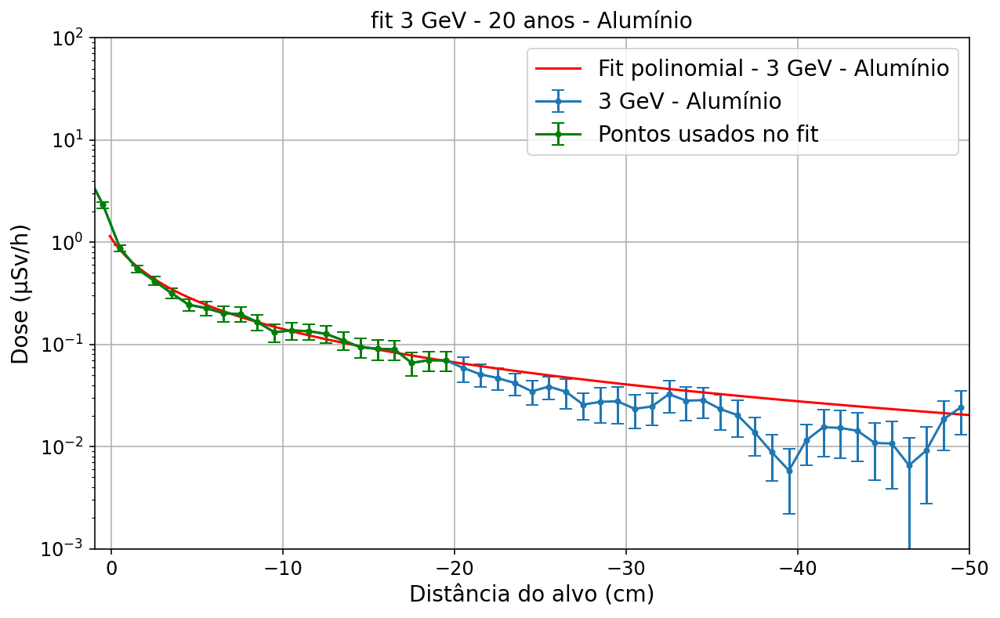

         2
0.01698 x - 0.03609 x + 0.02
0.016984319631628973 -0.03609394613424227 0.019995910617735438
0.0032977875621692226 0.002215098712420929 0.0003445050473535296
-9.786737655572187 1.8924937084174804


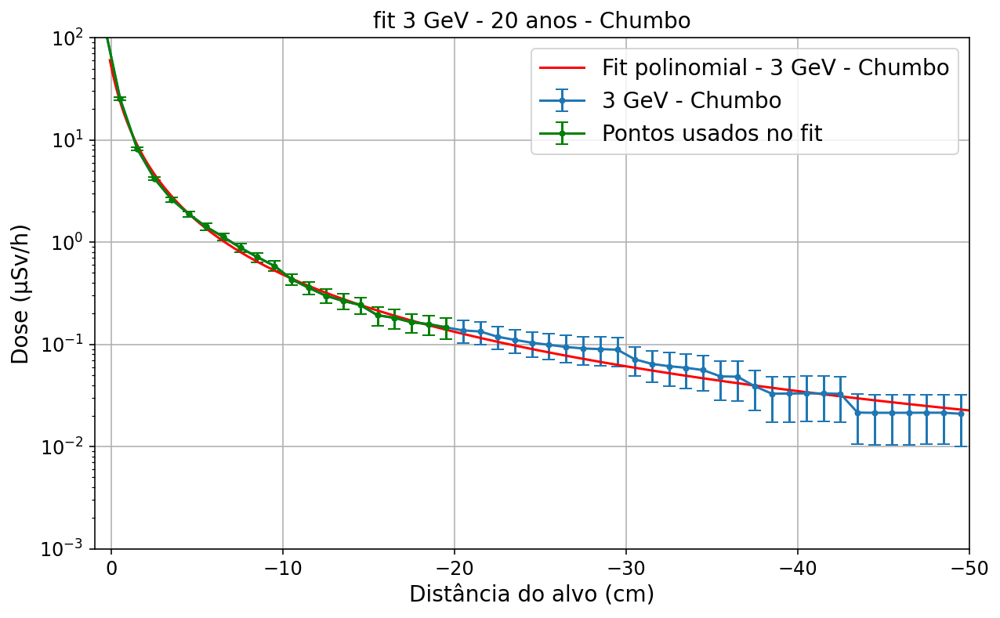

        2
0.8269 x - 3.979 x + 4.443
0.8269022181024883 -3.97933572051949 4.442813016648924
0.44008462362910855 0.37386666535860613 0.039608454654129197
0.7222813308655772 2.2873249895429093


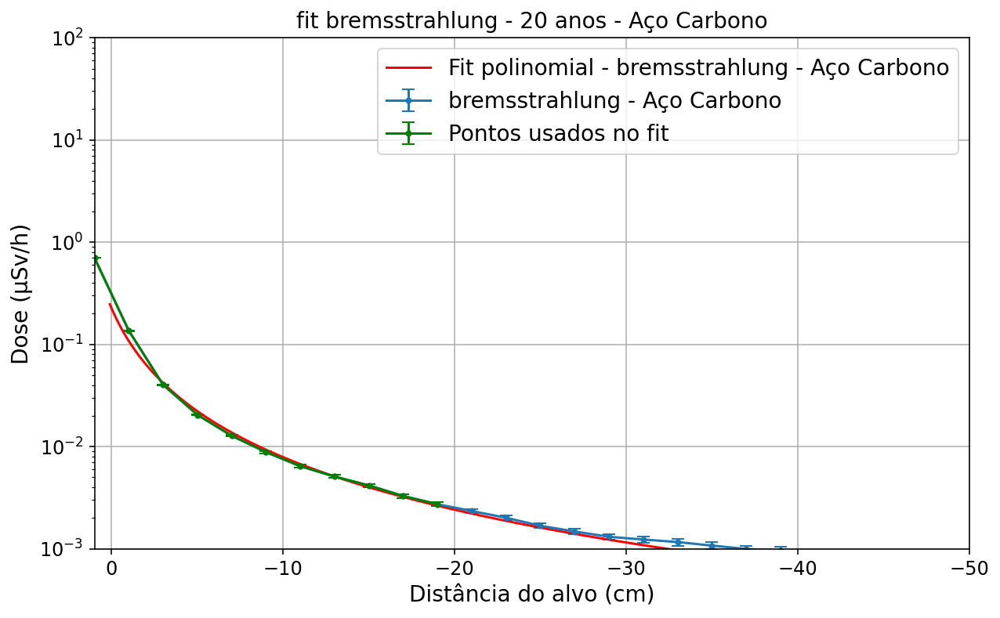

        2
0.5181 x - 2.93 x + 3.304
0.5180584893965091 -2.9297483605373125 3.303504787098139
0.33260531131210097 0.28089051861102277 0.028627377310584238
0.48682878015122677 1.6703751162479497


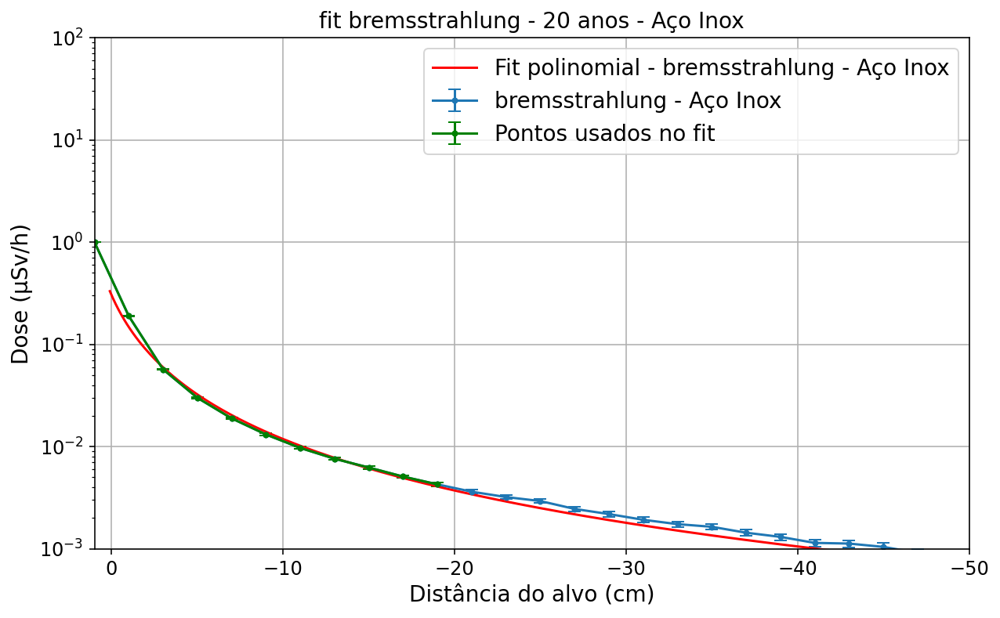

        2
0.7553 x - 3.598 x + 3.924
0.75530426395947 -3.5984330197230294 3.9241250503433673
0.3687161056751362 0.3162662420900486 0.03291725397994362
0.6137880491849573 1.8109659289312474


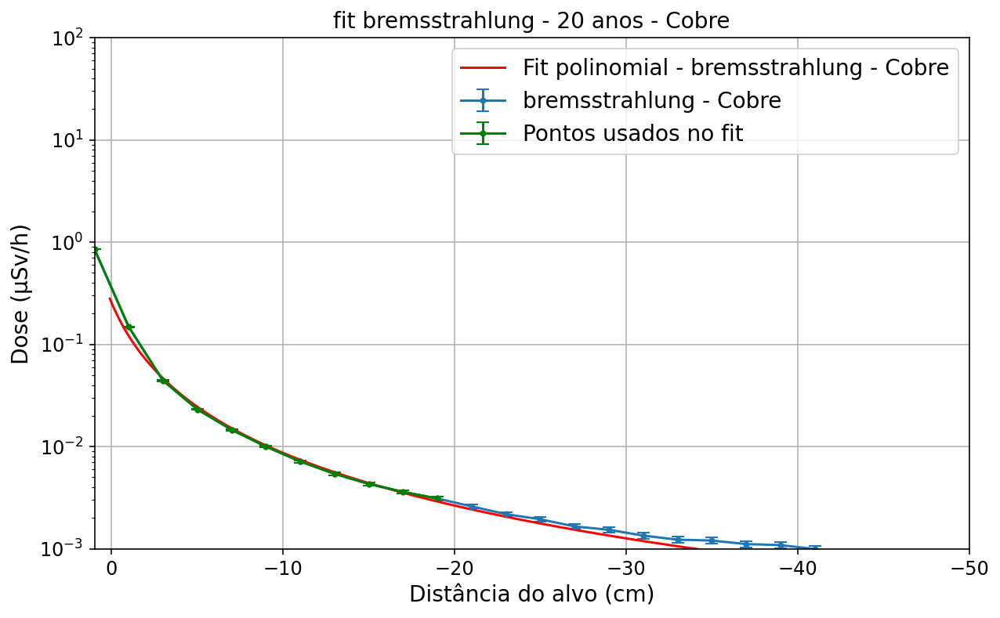

       2
1.779 x - 28.52 x + 37
1.7792508812943912 -28.521029523512375 36.99979140558866
3.4789424461780665 2.6530620905440654 0.2329296990471607
1.3390079618412938 504.4061285838086


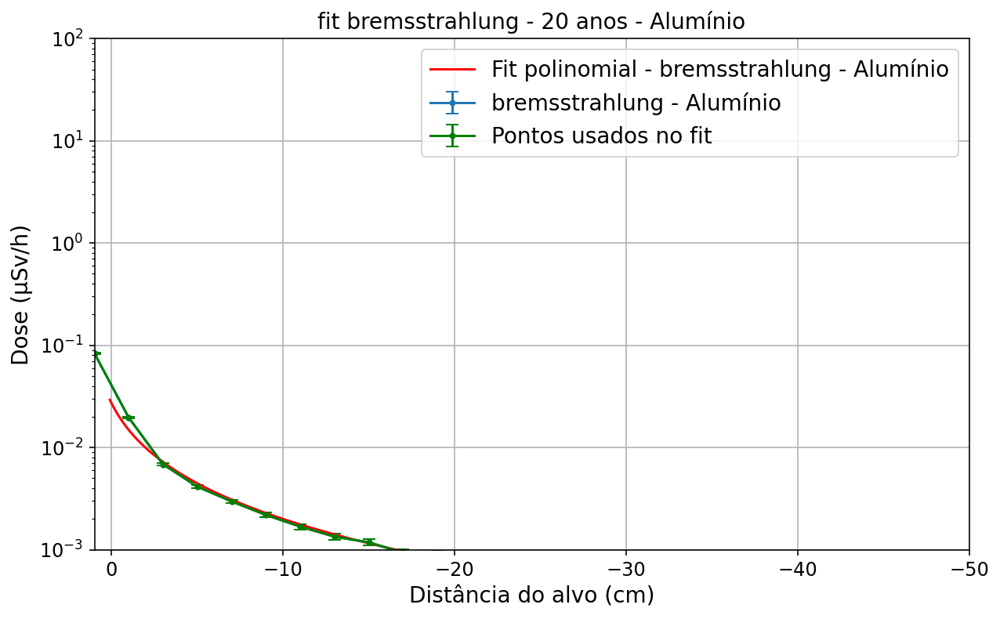

       2
1.484 x - 3.949 x + 3.542
1.4842326429514625 -3.949352223965063 3.5424569088486684
0.4950871137466295 0.434043180471451 0.04935067879625717
0.4755493731898971 1.3198175390229787


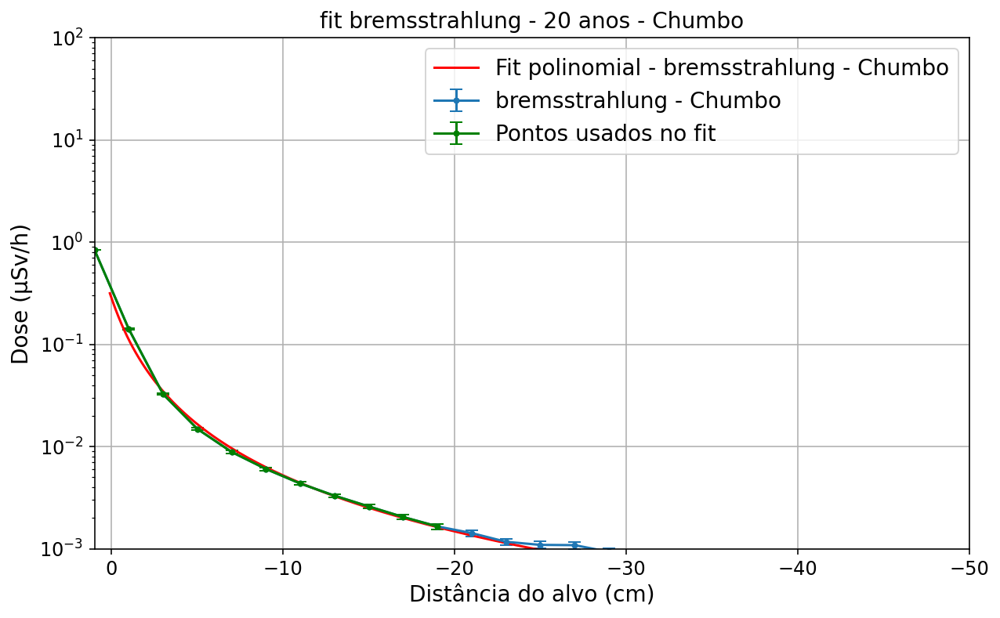

Linac_1:
Tempos              Aço Carbono         Aço Inox            Cobre               Alumínio            Chumbo              
20 anos             12.310 +- 2.279     17.036 +- 4.982     15.424 +- 4.631     2.492 +- 11.874     5.293 +- 0.699      

Lifetime_1:
Tempos              Aço Carbono         Aço Inox            Cobre               Alumínio            Chumbo              
20 anos             14.427 +- 12.493    16.520 +- 8.744     13.693 +- 7.627     1.972 +- 12.012     9.787 +- 1.892      

Brem_4:
Tempos              Aço Carbono         Aço Inox            Cobre               Alumínio            Chumbo              
20 anos             0.722 +- 2.287      0.487 +- 1.670      0.614 +- 1.811      1.339 +- 504.406    0.476 +- 1.320      



In [9]:
import matplotlib.pyplot as plt
import numpy as np
# Script para plotar a dose distante do material em cada caso-material-tempo com um fit de inverso do quadrado
############################ Configurações Dose em cada caso ####################################
casos_pastas = ['Linac_1', 'Lifetime_1', 'Brem_4']  # Pastas de cada caso
normal = 1E-6*3600
casos_norm = [4*normal, 1*normal, 1.33*1e-11*normal]     # normalização de cada caso
casos = ['150 MeV', '3 GeV', 'bremsstrahlung']    # labels de cada caso

materiais_pastas = ['/MAT1', '/MAT2', '/MAT3', '/MAT4', '/MAT5']                         # Pastas dos materiais que serão usados
materiais = ['Aço Carbono', 'Aço Inox', 'Cobre', 'Alumínio', 'Chumbo']               # nomes dos materiais na mesma ordem das pastas
# materiais_pastas = ['/MAT5']                         # Pastas dos materiais que serão usados
# materiais = ['Chumbo']               # nomes dos materiais na mesma ordem das pastas

# tempos_pastas = ['/IRR1', '/IRR2', '/IRR3', '/IRR4', '/IRR5', '/IRR6']                           # Pastas dos tempos de irradiação
# tempos = ['1 semana', '1 mês', '1 ano', '5 anos', '10 anos', '20 anos']   # nomes dos tempos na mesma ordem das pastas
tempos_pastas = ['/IRR6']                           # Pastas dos tempos de irradiação
tempos = ['20 anos']   # nomes dos tempos na mesma ordem das pastas

f_file = '/Act_Sirius_26_plot.dat'
f_file2 = '/UVX_25_brabo.dat'
direct = ''

x_primeiro = 0
xmin = -20
xmax = 2
dose_min = 0.5 # µSv/h
###########################################################################################################


def Ler_dat(arquivo1, arquivo2, norm):
    try:
        f = open(arquivo1, 'r')
    except:
        f = open(arquivo2, 'r')
    f.seek(0)
    lines=f.readlines()
    dist = []
    dose = []
    dose_err = []
    for line in lines:
        if len(line.split()) > 3:
            try:
                dist.append( (float(line.split()[0]) + float(line.split()[1]))/2 )
                dose.append(float(line.split()[2])*norm)
                dose_err.append(dose[-1]*float(line.split()[3])/100)
            except:
                pass
    
    return dist, dose, dose_err

def poly_negative(x, y, yerr, num, xmin, xmax):
    x_lim = []
    y_lim = []
    yerr_lim = []
    peso = []
    for i in range(len(x)):
        if xmin < x[i] < xmax:
            if y[i] > 0:
                x_lim.append(x[i])
                y_lim.append(1/y[i])
#                 yerr_lim.append( yerr[i]/(y[i]**2) )
                yerr_lim.append(yerr[i])
                peso.append(y[i]/np.sqrt(yerr[i]))
            else:
                pass
    z, cov = np.polyfit(x_lim, y_lim, num, w=peso, cov=True)
#     z = np.polyfit(x_lim, y_lim, num, w=peso)
    
    return x_lim, y_lim, yerr_lim, z, cov

def Inverso_quadrado(xp, x, y):
    yp = []
    for i, xi in enumerate(xp):
        if xi != 0:
            yi = y*(x**2/(xi**2))
            yp.append(yi)
        else:
            popi = xp.pop(xp.index(0))
    return yp


def Dose_caso(caso_i, tempo_j, material_k, xmin, xmax, x_primeiro, dose_min):
    fig, ax = plt.subplots()
#     fig.tight_layout()
    ax.patch.set_facecolor('white')
    fig.patch.set_facecolor('white')
    fig.set_size_inches(10, 6)
    pasta = direct + casos_pastas[caso_i] + tempos_pastas[tempo_j] + materiais_pastas[material_k]
    x, y, y_err = Ler_dat(pasta+f_file, pasta+f_file2, casos_norm[caso_i])
    plt.errorbar(x, y, y_err, marker='.', linestyle='-', capsize=4, label=casos[caso_i] + ' - ' + materiais[material_k])  # para atividade total
#     y2 = []
#     for i in y:
#         if i == 0:
#             y2.append(0)
#         else:
#             y2.append(1/i)
            
#     plt.errorbar(x, y2, y_err, marker='.', linestyle='-', capsize=4, label=casos[caso_i] + ' - ' + materiais[material_k])  # para atividade total
    plt.grid(True)
    plt.yscale('log')
    plt.xlabel('Distância do alvo (cm)',fontsize=14)
    plt.ylabel('Dose (µSv/h)',fontsize=14)
    plt.ylim(bottom=1e-3, top=1e2)
    plt.xlim(1, -50)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.title('fit '+ casos[caso_i] + ' - ' + tempos[tempo_j] + ' - ' + materiais[material_k], fontsize=14)


    x_pol, y_pol, y_polerr, z, cov = poly_negative(x, y, y_err, 2, xmin, xmax)
    p = np.poly1d(z)
#     if -p[1]/(2*p[2]) < 0:
#         p[1] = abs(p[1])
#         p[2] = -abs(p[2])
#     dose_min_x_plus  = (   -p[1] + np.sqrt( p[1]**2 - 4*p[2]*(p[0]-(1/dose_min)) )   ) / (2*p[2])
#     dose_min_x_minus = (   -p[1] - np.sqrt( p[1]**2 - 4*p[2]*(p[0]-(1/dose_min)) )   ) / (2*p[2])
    delta = np.sqrt( p[1]**2 - 4*p[2]*(p[0]-(1/dose_min)) )
    dose_min_x = (  -p[1] - delta  ) / (2*p[2])
    perr = np.sqrt(np.diag(cov))
    dose_min_xerr = np.sqrt( ( ( (p[0]-(1/dose_min))/(2*delta) + (p[1]+delta)/(2*(p[2]**2)) )*perr[2] )**2  +  ( ( (1/(2*p[2]))+(p[1]/(2*p[2])*delta) )*perr[1] )**2  +  ( ( 2/delta )*perr[0] )**2   )
    
    print(p)   # Polinômio fit
    print(p[2], p[1], p[0])   # Polinômio fit
    print(perr[2], perr[1], perr[0])   # Polinômio fit
    print(dose_min_x,dose_min_xerr)
#     print(casos[caso_i] + ' - ' + tempos[tempo_j] + ' - ' + materiais[material_k])
#     print(f'Distância necessária para atingir a dose de {dose_min} µSv/h é de {abs(dose_min_x):.3f} cm')
    xp = np.linspace(0.1, -50, 300)
    plt.errorbar(x_pol, [1/i for i in y_pol], y_polerr, marker='.', linestyle='-', capsize=4, label='Pontos usados no fit', color='g')
    plt.plot(xp, [1/i for i in p(xp)], linestyle='-', label='Fit polinomial - '+ casos[caso_i] + ' - ' + materiais[material_k], color='r')
#     plt.errorbar(x_pol, y_pol, y_polerr, marker='.', linestyle='-', capsize=4, label='Pontos usados no fit', color='g')
#     plt.plot(xp, p(xp), linestyle='-', label='Fit polinomial - '+ casos[caso_i] + ' - ' + materiais[material_k], color='r')
    
    x_0 = x[0]
    y_0 = y[0]
    x_minus = -21786311231
    x_plus = 1291371721
    i_minus = 0
    i_plus = 0
    for i, xi in enumerate(x):
        # if x_minus < xi < 0:
        #     x_minus = xi
        #     i_minus = i
        # elif 0 < xi < x_plus:
        #     x_plus = xi
        #     i_plus = i
        # if x_minus != x_plus:
        #     x_0 = (x_minus + x_plus)/2
        # else:
        #     x_0 = 0.1
        # y_0 = (y[i_minus] + y[i_plus])/2
        if 0 < (xi - x_primeiro)**2 < (x_0 - x_primeiro)**2:
            x_0 = xi
            y_0 = y[i]
#     plt.plot(xp, Inverso_quadrado(xp, x_0, y_0), linestyle='-', label='Inverso do quadrado - '+ casos[caso_i] + ' - ' + materiais[material_k], color='black')

    plt.legend(loc='upper right')
#     plt.savefig('fig - '+ casos[caso_i] + ' - ' + tempos[tempo_j] + ' - ' + materiais[material_k]+ '.png')
    plt.show()
    return abs(dose_min_x), dose_min_xerr

distancias = {}
distanciaserr = {}

for i, caso in enumerate(casos_pastas):
    distancias[caso] = []
    distanciaserr[caso] = []
    for j, tempo in enumerate(tempos):
        distancias[caso].append([])
        distanciaserr[caso].append([])
        for k, material in enumerate(materiais_pastas): 
            distancias[caso][j].append( Dose_caso(i, j, k, xmin, xmax, x_primeiro, dose_min) )
            
for i, caso in enumerate(casos_pastas):
    print(caso + ':')
    print( ''.join(['{:20}'.format(item) for item in ['Tempos'] + materiais]) )
    for j, tempo in enumerate(tempos):
        print(''.join(['{:20}'.format(tempo)] + ['{:20}'.format( str('{:.3f}'.format(item[0])) + ' +- ' + str('{:.3f}'.format(item[1]))) for item in distancias[caso][j]]) )
#         print(''.join(['{:15}'.format(' ')] + ['{:15}'.format( str('{:.3f}'.format(item[1]))) for item in distancias[caso][j]]) )
    print('')

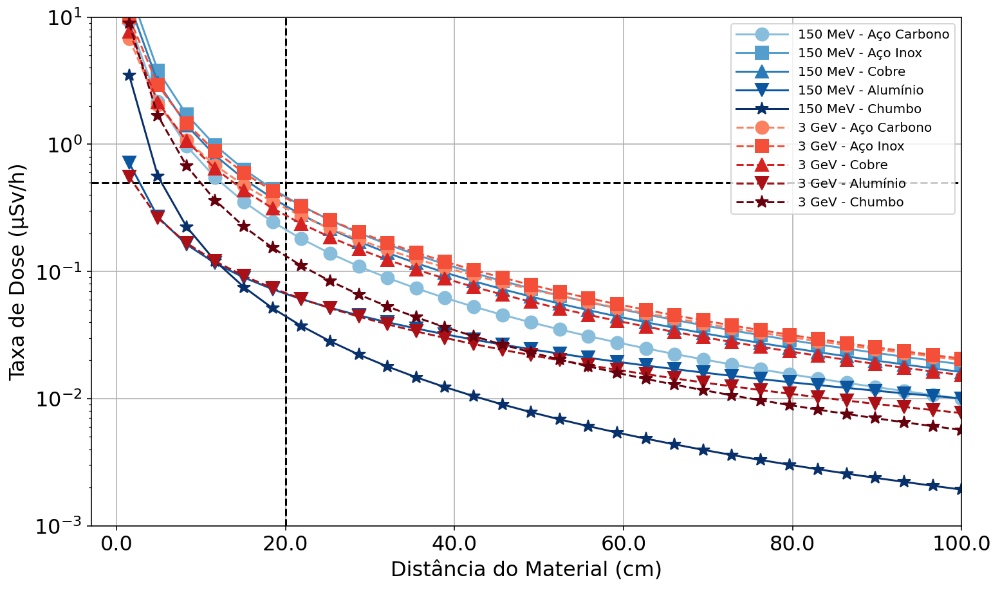

In [14]:
import matplotlib.pyplot as plt
from matplotlib import cm
from cycler import cycler
import numpy as np
# Script para plotar o fit da dose distante do material em cada caso-material com gráficos separados pelo tempo
##################################### Configurações Fit da Dose ############################################
casos_pastas = ['Linac_1', 'Lifetime_1', 'Brem_4']  # Pastas de cada caso
normal = 1E-6*3600
casos_norm = [4*normal, 1*normal, 1.33*1e-11*normal]     # normalização de cada caso
casos = ['150 MeV', '3 GeV', 'bremsstrahlung']    # labels de cada caso

materiais_pastas = ['/MAT1', '/MAT2', '/MAT3', '/MAT4', '/MAT5']                         # Pastas dos materiais que serão usados
materiais = ['Aço Carbono', 'Aço Inox', 'Cobre', 'Alumínio', 'Chumbo']               # nomes dos materiais na mesma ordem das pastas
# materiais_pastas = ['/MAT5']                         # Pastas dos materiais que serão usados
# materiais = ['Chumbo']               # nomes dos materiais na mesma ordem das pastas

# tempos_pastas = ['/IRR1', '/IRR2', '/IRR3', '/IRR4', '/IRR5', '/IRR6']                           # Pastas dos tempos de irradiação
# tempos = ['1 semana', '1 mês', '1 ano', '5 anos', '10 anos', '20 anos']   # nomes dos tempos na mesma ordem das pastas

tempos_pastas = ['/IRR6']                           # Pastas dos tempos de irradiação
tempos = ['20 anos']   # nomes dos tempos na mesma ordem das pastas


f_file = '/Act_Sirius_26_plot.dat'
f_file2 = '/UVX_25_brabo.dat'
direct = ''

xmin = -20
xmax = 0

colormaps = ['Blues', 'Reds', 'YlGr', 'Grays']  # Cores variando de claro a escuro nas escalas do azul, vermelho, 'verde amarelado' e cinza
linestyles = ['solid', 'dashed', 'dashdot', 'dotted']  # Estilos de linha variando de sólido, tracejado, tracejado com pontos, e pontilhado
markers = ['o', 's', '^', 'v', '*', '<', '>', 'p', 'd']  # Marcadores variando de circulos, quadrados, triangulos, tringulos pra baixo, estrelas, tringulos pra esquerda, tringulos pra direita, pentagonos e losangos
###########################################################################################################


def Ler_dat(arquivo1, arquivo2, norm):
    try:
        f = open(arquivo1, 'r')
    except:
        f = open(arquivo2, 'r')
    f.seek(0)
    lines=f.readlines()
    dist = []
    dose = []
    dose_err = []
    for line in lines:
        if len(line.split()) > 3:
            try:
                dist.append( (float(line.split()[0]) + float(line.split()[1]))/2 )
                dose.append(float(line.split()[2])*norm)
                dose_err.append(dose[-1]*float(line.split()[3])/100)
            except:
                pass
    
    return dist, dose, dose_err


def poly_negative(x, y, yerr, num, xmin, xmax):
    x_lim = []
    y_lim = []
    yerr_lim = []
    peso = []
    for i in range(len(x)):
        if xmin < x[i] < xmax:
            if y[i] > 0:
                x_lim.append(x[i])
                y_lim.append(1/y[i])
                # yerr_lim.append( yerr[i]/(y[i]**2) )
                yerr_lim.append(yerr[i])
                peso.append(y[i]/np.sqrt(yerr[i]))
            else:
                pass
    z = np.polyfit(x_lim, y_lim, num, w=peso)
    
    return x_lim, y_lim, yerr_lim, z


def Dose_fits(tempo_j, xmin, xmax):

    fig, ax = plt.subplots()
    fig.tight_layout()
    ax.patch.set_facecolor('white')
    fig.patch.set_facecolor('white')
    # fig.patch.set_alpha(0)
    fig.set_size_inches(10, 6)
    
    plt.grid(True)
    plt.yscale('log')
    plt.xlabel('Distância do Material (cm)', fontsize=16)
    plt.ylabel('Taxa de Dose (µSv/h)', fontsize=16)  # para atividade total
    plt.ylim(bottom=1e-3, top=1e1)
    plt.xlim(3, -100)
#     print(plt.xticks())
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    
    plt.axhline(y=0.5, color='black', linestyle='--')
    plt.axvline(x=-20, color='black', linestyle='--')

    for caso_i in range(len(casos_pastas)):
        # Setando a cor do caso
        shift = 3  # Para não pegar o totalmente branco nas escalas
        color = cm.get_cmap( colormaps[caso_i], len(materiais_pastas)+shift)(range(shift, len(materiais_pastas)+shift) )
        line_style = linestyles[caso_i]
        ax.set_prop_cycle( (cycler(color=color)) )
        
        for material_k in range(len(materiais_pastas)):
            pasta = direct + casos_pastas[caso_i] + tempos_pastas[tempo_j] + materiais_pastas[material_k]
            x, y, y_err = Ler_dat(pasta+f_file, pasta+f_file2, casos_norm[caso_i])
#             x = [-i for i in x]


            x_pol, y_pol, y_polerr, z = poly_negative(x, y, y_err, 2, xmin, xmax)
            # z[1] = 0
            # z[2] = 0
            p = np.poly1d(z)
            if -p[1]/(2*p[2]) < 0:
                p[2] = -p[2]
            xp = np.linspace(-1.5, -100, 30)
            marker_style = markers[material_k]
            plt.plot(xp, [1/i for i in p(xp)], marker=marker_style, markersize=10, linestyle=line_style, label= casos[caso_i] + ' - ' + materiais[material_k])
            plt.legend(loc='upper right',handlelength=4)
#     print(plt.xticks()[0])
    plt.xticks(plt.xticks()[0][:-1], [abs(i) for i in plt.xticks()[0][:-1]])
#     ax.set_xticklabels([item.get_text() for item in ax.get_xticklabels()])
    # plt.savefig('Fit inverso do quadrado' + ' - ' + tempos[tempo_j])
#     plt.title('Taxa de Dose em função da distância' + ' - ' + tempos[tempo_j], fontsize=14)
    plt.show()

    
for tempo_j in range(len(tempos)):
    Dose_fits(tempo_j, xmin, xmax)

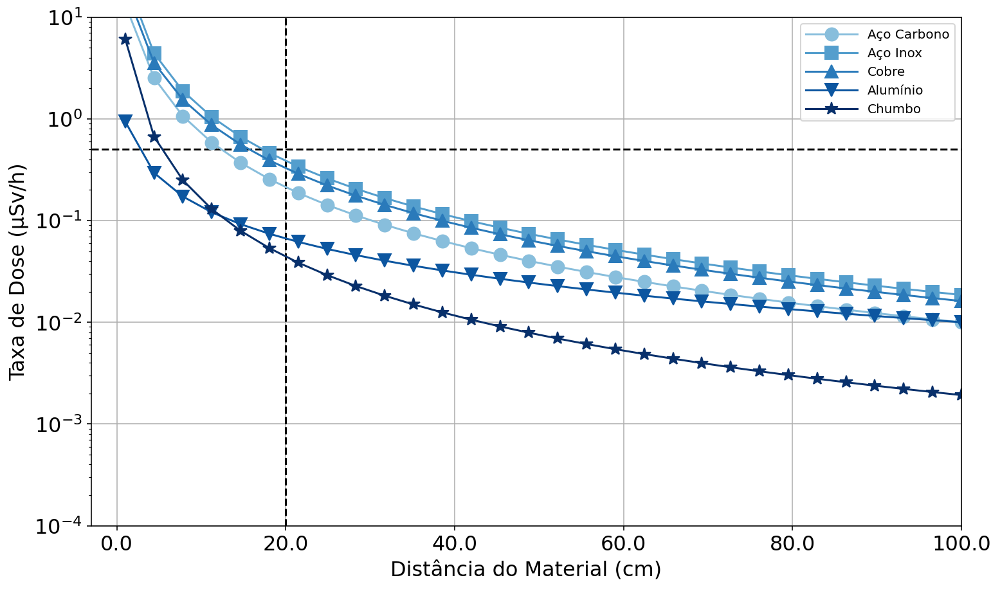

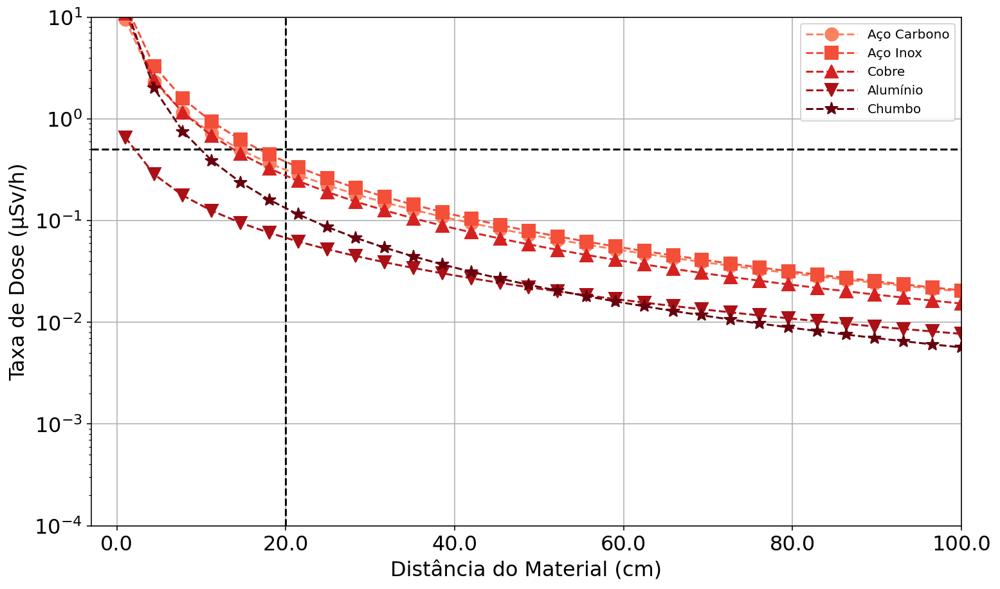

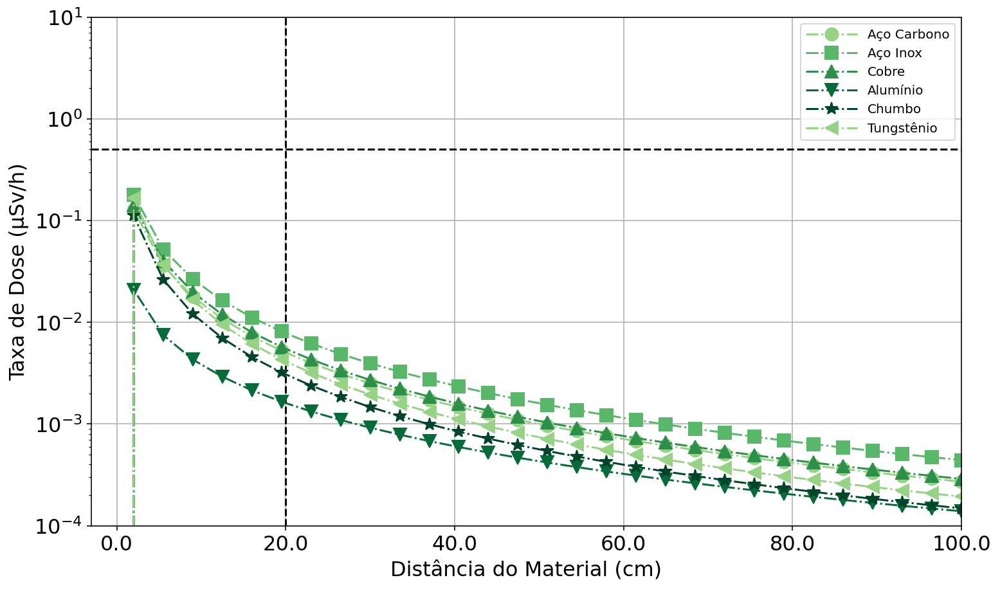

In [3]:
import matplotlib.pyplot as plt
from matplotlib import cm
from cycler import cycler
import numpy as np
# Script para plotar o fit da dose distante do material em cada caso-material com gráficos separados pelo tempo
##################################### Configurações Fit da Dose ############################################
casos_pastas = ['Linac_1', 'Lifetime_1', 'Brem_4']  # Pastas de cada caso
normal = 1E-6*3600
casos_norm = [4*normal, 1*normal, 2*1.33*1e-11*normal]     # normalização de cada caso
casos = ['150 MeV', '3 GeV', 'bremsstrahlung']    # labels de cada caso

materiais_pastas = ['/MAT1', '/MAT2', '/MAT3', '/MAT4', '/MAT5']                         # Pastas dos materiais que serão usados
materiais = ['Aço Carbono', 'Aço Inox', 'Cobre', 'Alumínio', 'Chumbo']               # nomes dos materiais na mesma ordem das pastas
# materiais_pastas = ['/MAT5']                         # Pastas dos materiais que serão usados
# materiais = ['Chumbo']               # nomes dos materiais na mesma ordem das pastas

# tempos_pastas = ['/IRR1', '/IRR2', '/IRR3', '/IRR4', '/IRR5', '/IRR6']                           # Pastas dos tempos de irradiação
# tempos = ['1 semana', '1 mês', '1 ano', '5 anos', '10 anos', '20 anos']   # nomes dos tempos na mesma ordem das pastas

tempos_pastas = ['/IRR6']                           # Pastas dos tempos de irradiação
tempos = ['20 anos']   # nomes dos tempos na mesma ordem das pastas


f_file = '/Act_Sirius_26_plot.dat'
f_file2 = '/UVX_25_brabo.dat'
direct = ''

xmin = -20
xmax = 0

colormaps = ['Blues', 'Reds', 'YlGn', 'Grays']  # Cores variando de claro a escuro nas escalas do azul, vermelho, 'verde amarelado' e cinza
linestyles = ['solid', 'dashed', 'dashdot', 'dotted']  # Estilos de linha variando de sólido, tracejado, tracejado com pontos, e pontilhado
markers = ['o', 's', '^', 'v', '*', '<', '>', 'p', 'd']  # Marcadores variando de circulos, quadrados, triangulos, tringulos pra baixo, estrelas, tringulos pra esquerda, tringulos pra direita, pentagonos e losangos
###########################################################################################################


def Ler_dat(arquivo1, arquivo2, norm):
    try:
        f = open(arquivo1, 'r')
    except:
        f = open(arquivo2, 'r')
    f.seek(0)
    lines=f.readlines()
    dist = []
    dose = []
    dose_err = []
    for line in lines:
        if len(line.split()) > 3:
            try:
                dist.append( (float(line.split()[0]) + float(line.split()[1]))/2 )
                dose.append(float(line.split()[2])*norm)
                dose_err.append(dose[-1]*float(line.split()[3])/100)
            except:
                pass
    
    return dist, dose, dose_err


def poly_negative(x, y, yerr, num, xmin, xmax):
    x_lim = []
    y_lim = []
    yerr_lim = []
    peso = []
    for i in range(len(x)):
        if xmin < x[i] < xmax:
            if y[i] > 0:
                x_lim.append(x[i])
                y_lim.append(1/y[i])
                # yerr_lim.append( yerr[i]/(y[i]**2) )
                yerr_lim.append(yerr[i])
                peso.append(y[i]/np.sqrt(yerr[i]))
            else:
                pass
    z = np.polyfit(x_lim, y_lim, num, w=peso)
    
    return x_lim, y_lim, yerr_lim, z


def Dose_fits(tempo_j, xmin, xmax):
    
    
    for caso_i in range(len(casos_pastas)):
        fig, ax = plt.subplots()
        fig.tight_layout()
        ax.patch.set_facecolor('white')
        fig.patch.set_facecolor('white')
        # fig.patch.set_alpha(0)
        fig.set_size_inches(10, 6)
        plt.grid(True)
        plt.yscale('log')
        plt.xlabel('Distância do Material (cm)', fontsize=16)
        plt.ylabel('Taxa de Dose (µSv/h)', fontsize=16)  # para atividade total
        plt.ylim(bottom=1e-4, top=1e1)
        plt.xlim(3, -100)
#     print(plt.xticks())
        plt.xticks(fontsize=16)
        plt.yticks(fontsize=16)
        plt.axhline(y=0.5, color='black', linestyle='--')
        plt.axvline(x=-20, color='black', linestyle='--')
        # Setando a cor do caso
        shift = 3  # Para não pegar o totalmente branco nas escalas
        color = cm.get_cmap(colormaps[caso_i], len(materiais_pastas)+shift)(range(shift, len(materiais_pastas)+shift) )
        line_style = linestyles[caso_i]
        ax.set_prop_cycle( (cycler(color=color)) )
        if caso_i == 2:
            mat_pastas = materiais_pastas + ['/MAT6']
            mat = materiais + ['Tungstênio']
            for material_k in range(len(mat_pastas)):
                pasta = direct + casos_pastas[caso_i] + tempos_pastas[tempo_j] + mat_pastas[material_k]
                x, y, y_err = Ler_dat(pasta+f_file, pasta+f_file2, casos_norm[caso_i])
    #             x = [-i for i in x]
                x_pol, y_pol, y_polerr, z = poly_negative(x, y, y_err, 2, xmin, xmax)
                # z[1] = 0
                # z[2] = 0
                p = np.poly1d(z)
                if -p[1]/(2*p[2]) < 0:
                    p[2] = -p[2]
                xp = np.linspace(1.5, -100, 30)
                marker_style = markers[material_k]
                plt.plot(xp, [1/i for i in p(xp)], marker=marker_style, markersize=10, linestyle=line_style, label= mat[material_k])
                plt.legend(loc='upper right',handlelength=4)
        else:
            for material_k in range(len(materiais_pastas)):
                pasta = direct + casos_pastas[caso_i] + tempos_pastas[tempo_j] + materiais_pastas[material_k]
                x, y, y_err = Ler_dat(pasta+f_file, pasta+f_file2, casos_norm[caso_i])
    #             x = [-i for i in x]
                x_pol, y_pol, y_polerr, z = poly_negative(x, y, y_err, 2, xmin, xmax)
                # z[1] = 0
                # z[2] = 0
                p = np.poly1d(z)
                if -p[1]/(2*p[2]) < 0:
                    p[2] = -p[2]
                xp = np.linspace(-1, -100, 30)
                marker_style = markers[material_k]
                plt.plot(xp, [1/i for i in p(xp)], marker=marker_style, markersize=10, linestyle=line_style, label= materiais[material_k])
                plt.legend(loc='upper right',handlelength=4)
#     print(plt.xticks()[0])
        plt.xticks(plt.xticks()[0][:-1], [abs(i) for i in plt.xticks()[0][:-1]])
#     ax.set_xticklabels([item.get_text() for item in ax.get_xticklabels()])
    # plt.savefig('Fit inverso do quadrado' + ' - ' + tempos[tempo_j])
#     plt.title('Taxa de Dose em função da distância' + ' - ' + tempos[tempo_j], fontsize=14)
        plt.show()

    
for tempo_j in range(len(tempos)):
    Dose_fits(tempo_j, xmin, xmax)

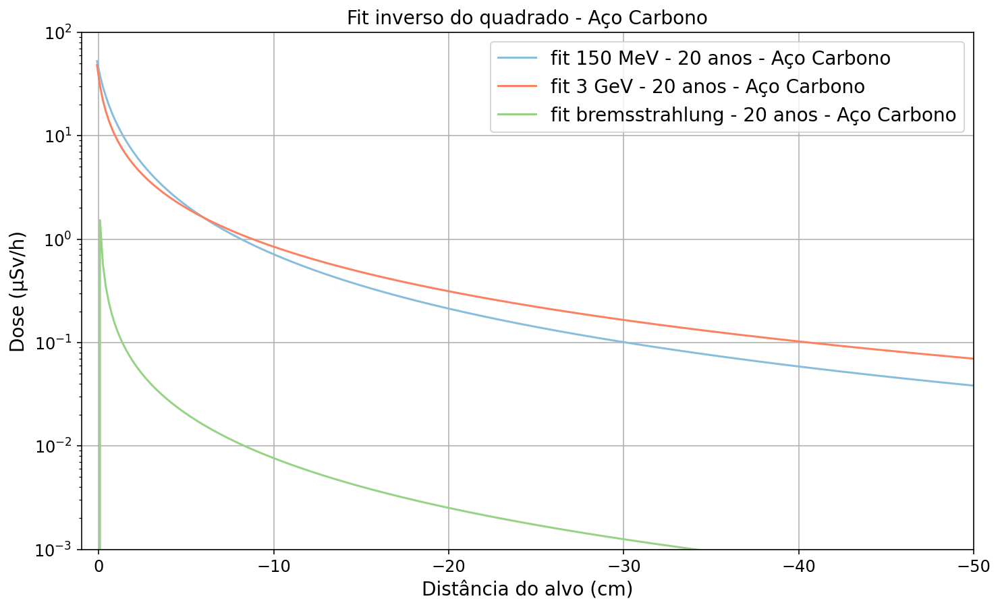

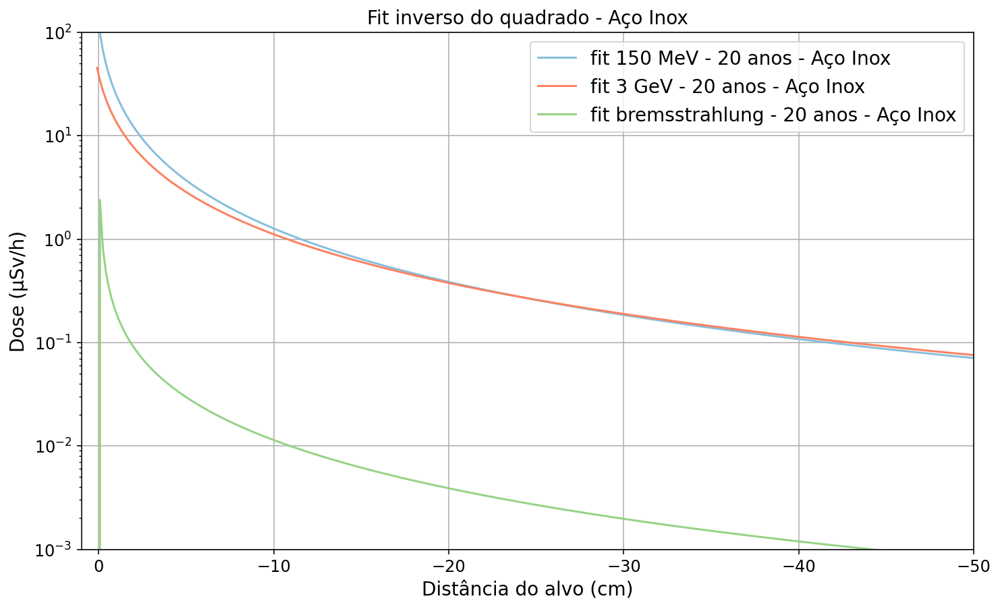

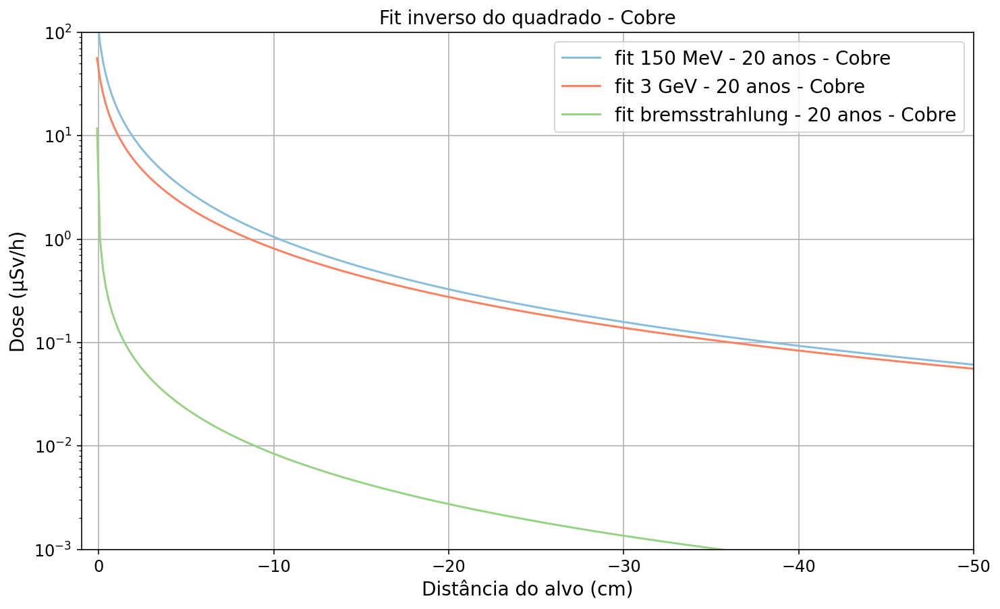

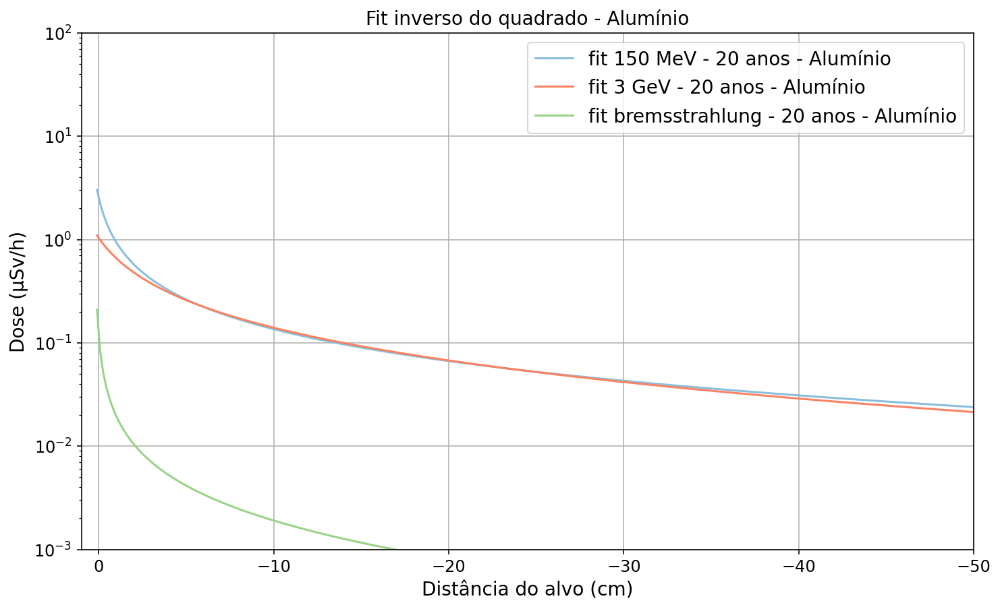

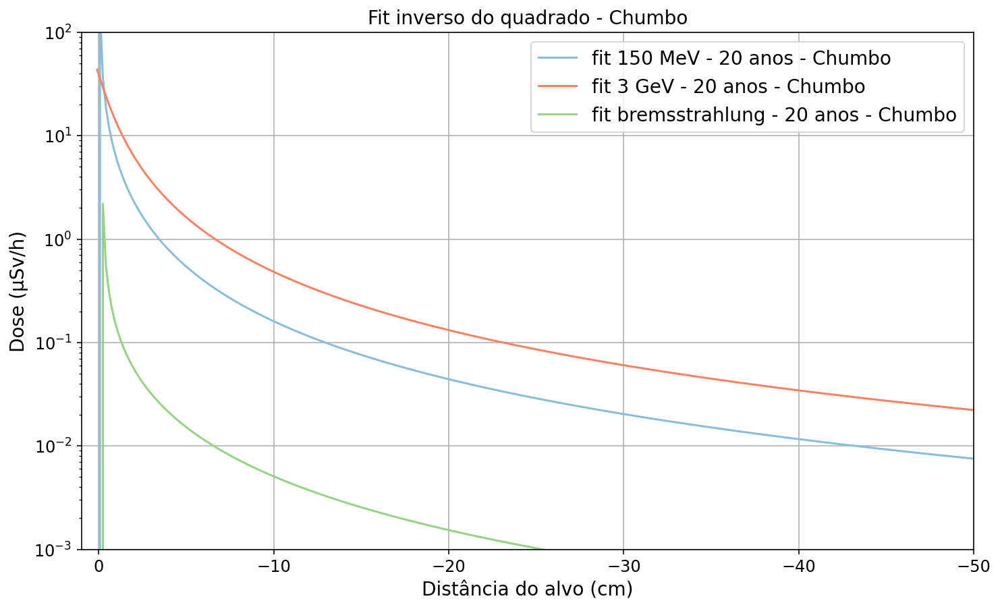

In [10]:
import matplotlib.pyplot as plt
from matplotlib import cm
from cycler import cycler
import numpy as np
# Script para plotar o fit da dose distante do material em cada caso tudo junto no mesmo plot
##################################### Configurações Fit da Dose ############################################
casos_pastas = ['Linac_1', 'Lifetime_1', 'Brem_4']  # Pastas de cada caso
normal = 1E-6*3600
casos_norm = [4*normal, 1*normal, 1.33*1e-11*normal]     # normalização de cada caso
casos = ['150 MeV', '3 GeV', 'bremsstrahlung']    # labels de cada caso

materiais_pastas = ['/MAT1', '/MAT2', '/MAT3', '/MAT4', '/MAT5']                         # Pastas dos materiais que serão usados
materiais = ['Aço Carbono', 'Aço Inox', 'Cobre', 'Alumínio', 'Chumbo']               # nomes dos materiais na mesma ordem das pastas
# materiais_pastas = ['/MAT5']                         # Pastas dos materiais que serão usados
# materiais = ['Chumbo']               # nomes dos materiais na mesma ordem das pastas

# tempos_pastas = ['/IRR1', '/IRR2', '/IRR3', '/IRR4', '/IRR5', '/IRR6']                           # Pastas dos tempos de irradiação
# tempos = ['1 semana', '1 mês', '1 ano', '5 anos', '10 anos', '20 anos']   # nomes dos tempos na mesma ordem das pastas
tempos_pastas = ['/IRR6']                           # Pastas dos tempos de irradiação
tempos = ['20 anos']   # nomes dos tempos na mesma ordem das pastas

f_file = '/Act_Sirius_26_plot.dat'
f_file2 = '/UVX_25_brabo.dat'
direct = ''

xmin = -20
xmax = 0

colormaps = ['Blues', 'Reds', 'YlGn', 'Grays']  # Cores variando de claro a escuro nas escalas do azul, vermelho, 'verde amarelado' e cinza
###########################################################################################################


def Ler_dat(arquivo1, arquivo2, norm):
    try:
        f = open(arquivo1, 'r')
    except:
        f = open(arquivo2, 'r')
    f.seek(0)
    lines=f.readlines()
    dist = []
    dose = []
    dose_err = []
    for line in lines:
        if len(line.split()) > 3:
            try:
                dist.append( (float(line.split()[0]) + float(line.split()[1]))/2 )
                dose.append(float(line.split()[2])*norm)
                dose_err.append(dose[-1]*float(line.split()[3])/100)
            except:
                pass
    
    return dist, dose, dose_err


def poly_negative(x, y, yerr, num, xmin, xmax):
    x_lim = []
    y_lim = []
    yerr_lim = []
    peso = []
    for i in range(len(x)):
        if xmin < x[i] < xmax:
            if y[i] > 0:
                x_lim.append(x[i])
                y_lim.append(1/y[i])
            # yerr_lim.append( yerr[i]/(y[i]**2) )
                yerr_lim.append(yerr[i])
                peso.append(y[i]/np.sqrt(yerr[i]))
            else:
                pass
    z = np.polyfit(x_lim, y_lim, num, w=peso)
    
    return x_lim, y_lim, yerr_lim, z


def Dose_fits_tudo(material_k, xmin, xmax):

    fig, ax = plt.subplots()
    fig.tight_layout()
    ax.patch.set_facecolor('white')
    fig.patch.set_facecolor('white')
    # fig.patch.set_alpha(0)
    fig.set_size_inches(10, 6)
    
    plt.grid(True)
    plt.yscale('log')
    plt.xlabel('Distância do alvo (cm)', fontsize=14)
    plt.ylabel('Dose (µSv/h)', fontsize=14)  # para atividade total
    plt.ylim(bottom=1e-3, top=1e2)
    plt.xlim(1, -50)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    
    for caso_i in range(len(casos_pastas)):
        # Setando a cor do caso
        shift = 3  # Para não pegar o totalmente branco nas escalas
        color = cm.get_cmap( colormaps[caso_i], 8)(range(shift, len(tempos_pastas)+shift) )
        ax.set_prop_cycle( (cycler(color=color)) )
        for tempo_j in range(len(tempos_pastas)):
            pasta = direct + casos_pastas[caso_i] + tempos_pastas[tempo_j] + materiais_pastas[material_k]
            x, y, y_err = Ler_dat(pasta+f_file, pasta+f_file2, casos_norm[caso_i])

            x_pol, y_pol, y_polerr, z = poly_negative(x, y, y_err, 2, xmin, xmax)
            # z[1] = 0
            # z[2] = 0
            p = np.poly1d(z)
            if -p[1]/(2*p[2]) < 0:
                p[2] = -p[2]
            xp = np.linspace(0.1, -50, 300)
            plt.plot(xp, [1/i for i in p(xp)], linestyle='-', label='fit '+ casos[caso_i] + ' - ' + tempos[tempo_j] + ' - ' + materiais[material_k])
            plt.legend(loc='upper right')

    # plt.savefig('Fit inverso do quadrado')
    plt.title('Fit inverso do quadrado - ' + materiais[material_k], fontsize=14)
    plt.show()

    
for material_k in range(len(materiais_pastas)):
    Dose_fits_tudo(material_k, xmin, xmax)

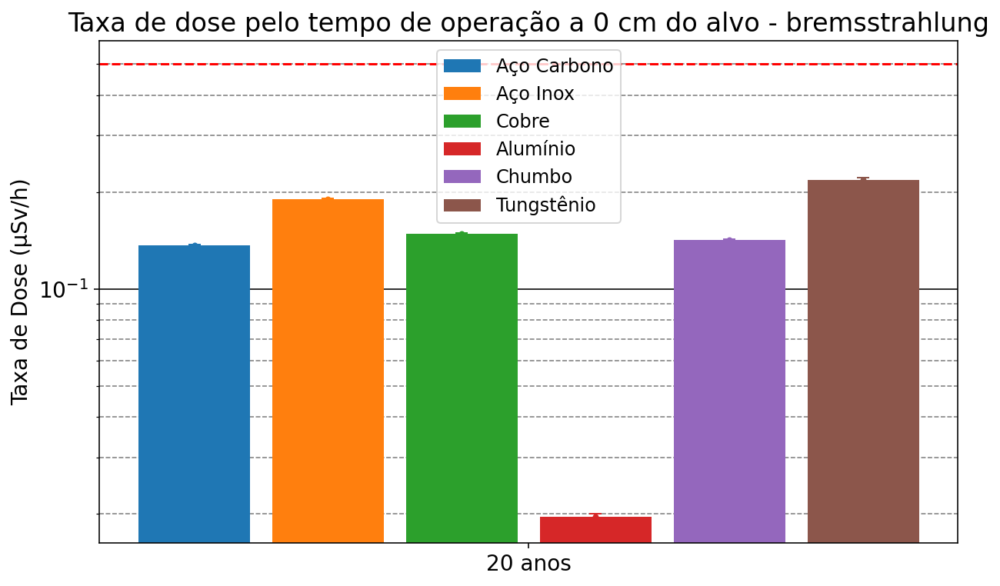

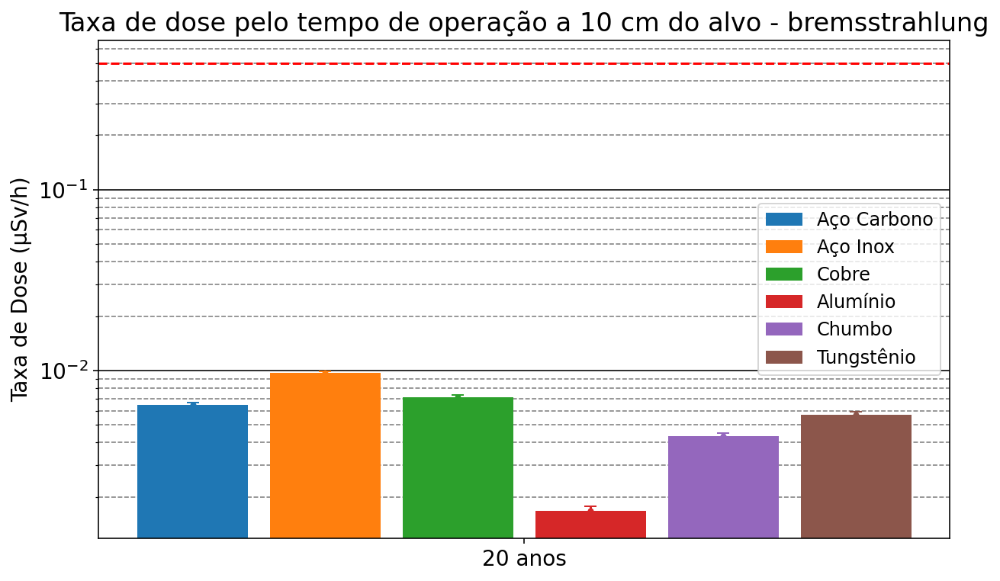

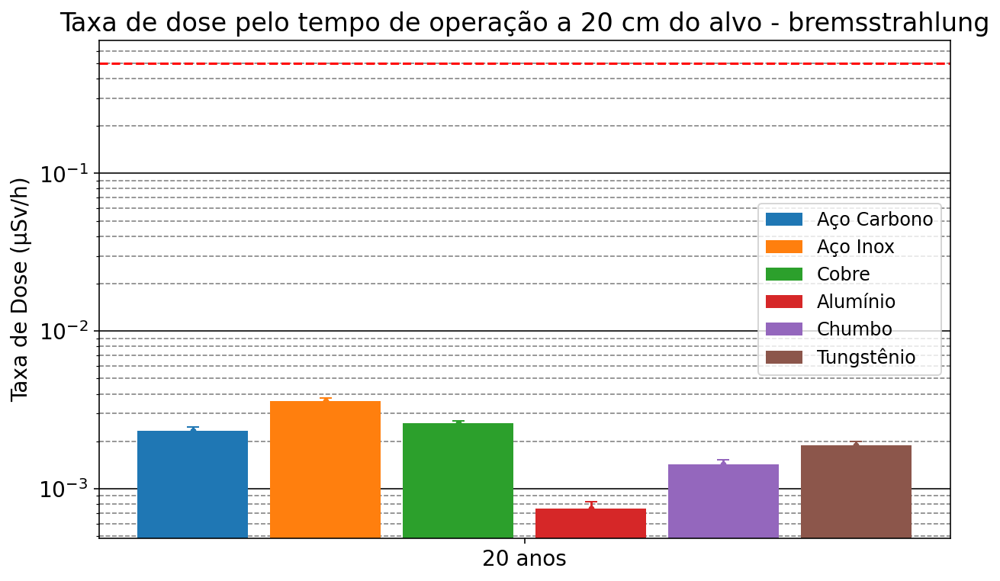

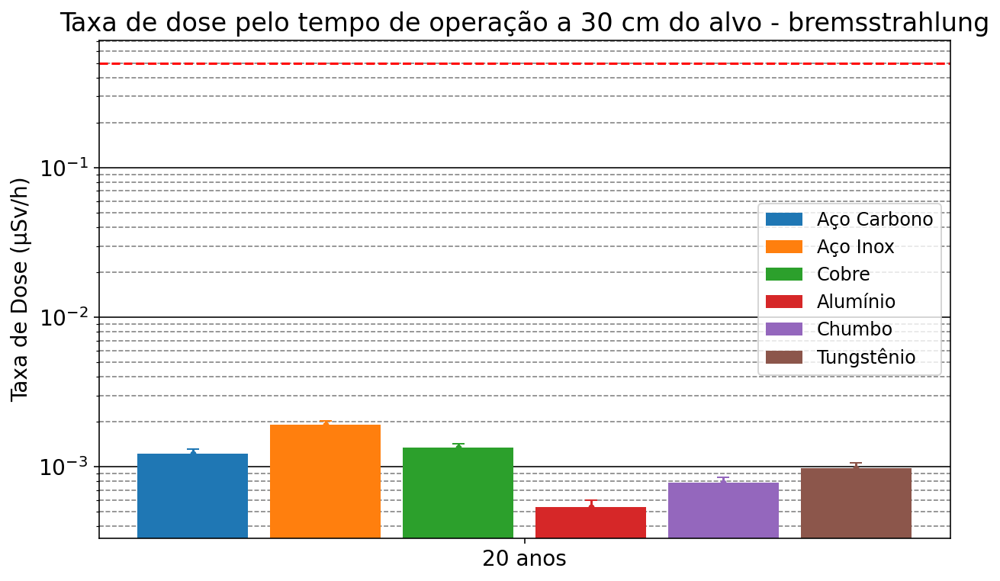

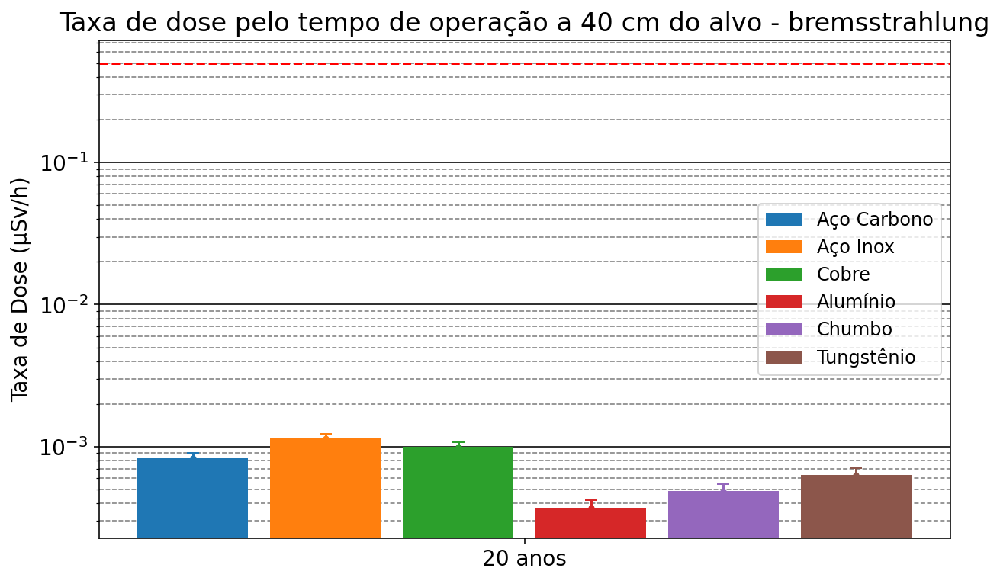

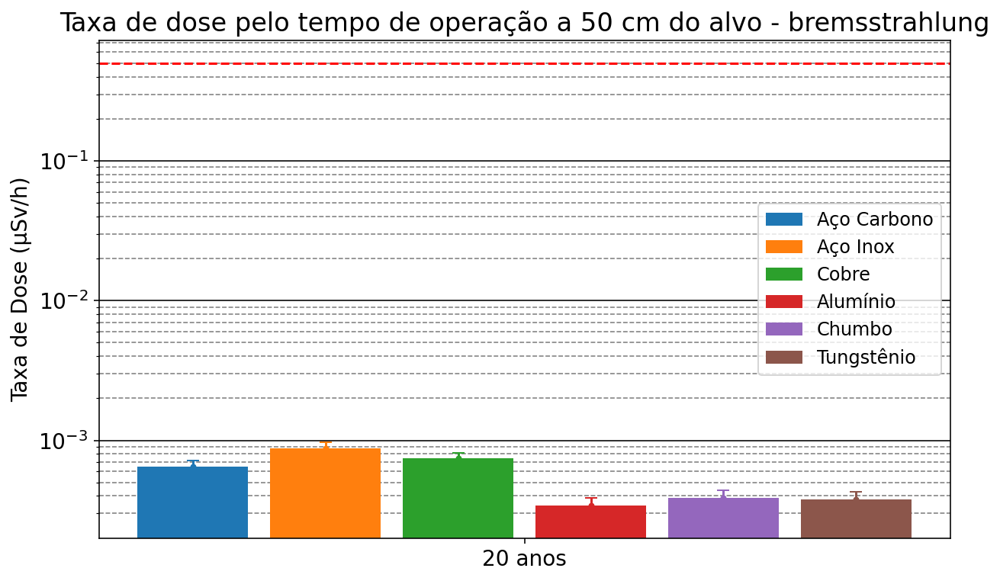

In [17]:
import matplotlib.pyplot as plt
import numpy as np
# Script para plotar as atividades totais de cada caso-material em gráficos separados pelo tempo
############################ Configurações Plot por tempo #############################################
# casos_pastas = ['Linac_1', 'Lifetime_1', 'Brem_4']  # Pastas de cada caso
# normal = 1E-6*3600
# casos_norm = [4*normal, 1*normal, 1.33*1e-11*normal]     # normalização de cada caso
# casos = ['150 MeV', '3 GeV', 'bremsstrahlung']    # labels de cada caso
casos_pastas = ['Brem_4']  # Pastas de cada caso
normal = 1E-6*3600
casos_norm = [1.33*1e-11*normal]     # normalização de cada caso
casos = ['bremsstrahlung']    # labels de cada caso

# materiais_pastas = ['/MAT1', '/MAT2', '/MAT3', '/MAT4', '/MAT5']                         # Pastas dos materiais que serão usados
# materiais = ['Aço Carbono', 'Aço Inox', 'Cobre', 'Alumínio', 'Chumbo']               # nomes dos materiais na mesma ordem das pastas
materiais_pastas = ['/MAT1', '/MAT2', '/MAT3', '/MAT4', '/MAT5', '/MAT6']                         # Pastas dos materiais que serão usados
materiais = ['Aço Carbono', 'Aço Inox', 'Cobre', 'Alumínio', 'Chumbo', 'Tungstênio']               # nomes dos materiais na mesma ordem das pastas

# tempos_pastas = ['/IRR1', '/IRR2', '/IRR3', '/IRR4', '/IRR5', '/IRR6']                           # Pastas dos tempos de irradiação
# tempos = ['1 semana', '1 mês', '1 ano', '5 anos', '10 anos', '20 anos']   # nomes dos tempos na mesma ordem das pastas
tempos_pastas = ['/IRR6']                           # Pastas dos tempos de irradiação
tempos = ['20 anos']   # nomes dos tempos na mesma ordem das pastas

f_file = '/Act_Sirius_26_plot.dat'
direct = ''

x_primeiro = 0
dose_min = 0.5 # µSv/h
ponto = -20
###########################################################################################################


def Ler_dat(arquivo1, norm):
    f = open(arquivo1, 'r')
    f.seek(0)
    lines=f.readlines()
    dist = []
    dose = []
    dose_err = []
    for line in lines:
        if len(line.split()) > 3:
            try:
                dist.append( (float(line.split()[0]) + float(line.split()[1]))/2 )
                dose.append(float(line.split()[2])*norm)
                dose_err.append(dose[-1]*float(line.split()[3])/100)
            except:
                pass
    
    return dist, dose, dose_err

def Ponto(arquivo, caso_i, ponto):
    x, y, yerr = Ler_dat(arquivo, casos_norm[caso_i])
    x_ponto = 1237198
    i_ponto = 273123
    for i in range(len(x)):
        if (x[i]- ponto)**2 < (x_ponto - ponto)**2:
            x_ponto = x[i]
            i_ponto = i
    y_ponto = y[i_ponto]
    y_pontoerr = yerr[i_ponto]
    
    return y_ponto, y_pontoerr

def plot_bar_pelo_tempo(caso_i, larg, maxim, titulo, titulo_y, ponto, dose_min):
    plt.rcParams.update({'font.size':14}) # tamanho da fonte dos graficos
    fig, ax = plt.subplots()
    x = np.arange(len(tempos_pastas))

    quanti = len(materiais)
    width = larg/quanti
    meio = (1+quanti)/2
    for i in range(1,quanti+1):
        y = []
        yerr = []
        for j, tempo in enumerate(tempos):
            pasta = direct + casos_pastas[caso_i] + tempos_pastas[j] + materiais_pastas[i-1]
            dos, doserr = Ponto(pasta+f_file, caso_i, ponto)
            y.append( dos )
            yerr.append( doserr )

        if meio == 1:
            dx = 0
        else:
            dx = maxim * (i- meio) / (meio-1)
        rects1 = ax.bar(x + dx*width*quanti, y, width, label=materiais[i-1])
        plt.errorbar(x + dx*width*quanti, y, yerr, marker='.', linestyle='', capsize=4)

    ax.legend(prop={'size': 12})

    ax.set_ylabel(titulo_y)
    ax.set_title(titulo)
    ax.set_xticks(x)
    # plt.xticks(rotation=-30)
    ax.set_xticklabels(tempos)
    ax.yaxis.grid(b=True, which='major', color='black', linestyle='-')
    ax.yaxis.grid(b=True, which='minor', color='gray', linestyle='--')
    ax.set_axisbelow(True)
    plt.yscale('log')
    plt.axhline(y=dose_min, color='r', linestyle='--')
    # fig.tight_layout()
    ax.patch.set_facecolor('white')
    fig.patch.set_facecolor('white')
    # fig.patch.set_alpha(0)
    fig.set_size_inches(10, 6)
    plt.show()


for pont in range(0, -51, -10):
    for i, caso in enumerate(casos):
        plot_bar_pelo_tempo(i, 0.5, 0.5, 'Taxa de dose pelo tempo de operação a ' + str(abs(pont)) + ' cm do alvo - ' + str(casos[i]), 'Taxa de Dose (µSv/h)', pont, dose_min)

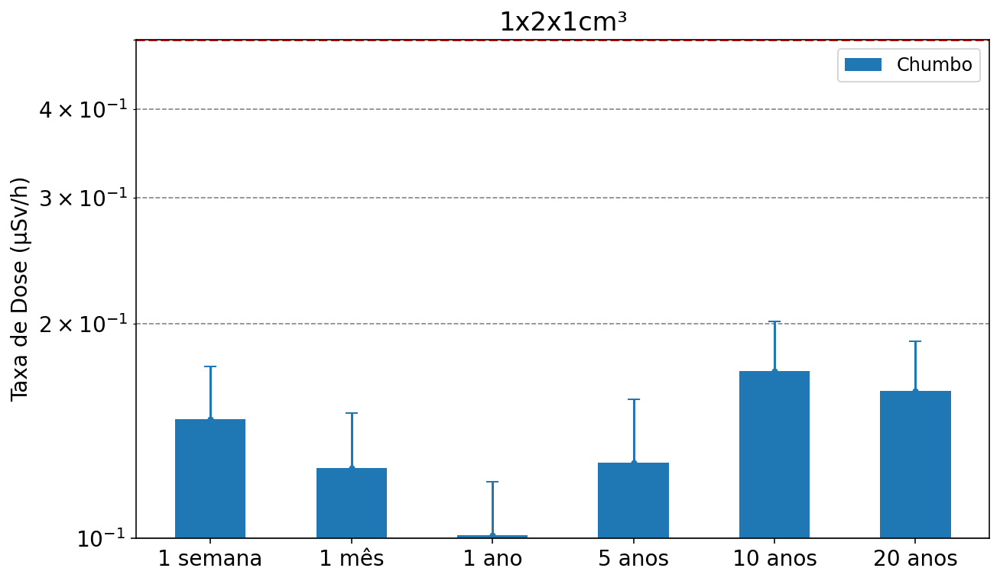

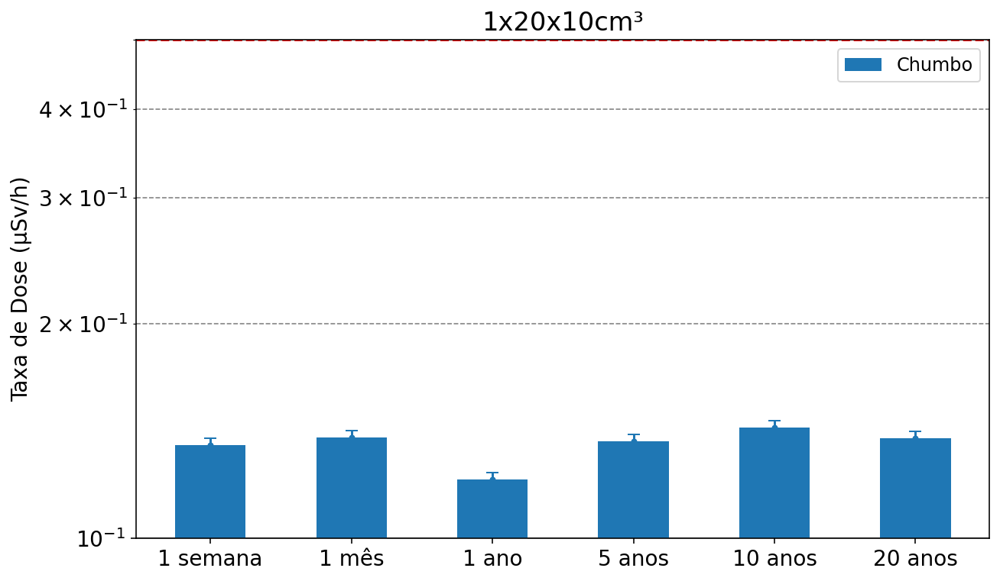

In [16]:
import matplotlib.pyplot as plt
import numpy as np
# Script para plotar as atividades totais de cada caso-material em gráficos separados pelo tempo
############################ Configurações Plot por tempo #############################################
casos_pastas = ['Linac_1', 'Lifetime_1']  # Pastas de cada caso
normal = 1E-6*3600
casos_norm = [4*normal, 1*normal]     # normalização de cada caso
casos = ['150 MeV', '3 GeV']    # labels de cada caso
casos_pastas = ['Lifetime_1']  # Pastas de cada caso
normal = 1E-6*3600
casos_norm = [1*normal]     # normalização de cada caso
casos = ['3 GeV']    # labels de cada caso

materiais_pastas = ['/MAT1', '/MAT2', '/MAT3', '/MAT4', '/MAT5']                         # Pastas dos materiais que serão usados
materiais = ['Aço Carbono', 'Aço Inox', 'Cobre', 'Alumínio', 'Chumbo']               # nomes dos materiais na mesma ordem das pastas
materiais_pastas = ['/MAT5']                         # Pastas dos materiais que serão usados
materiais = ['Chumbo']               # nomes dos materiais na mesma ordem das pastas

tempos_pastas = ['/IRR1', '/IRR2', '/IRR3', '/IRR4', '/IRR5', '/IRR6']                           # Pastas dos tempos de irradiação
tempos = ['1 semana', '1 mês', '1 ano', '5 anos', '10 anos', '20 anos']   # nomes dos tempos na mesma ordem das pastas

f_file = '/Act_Sirius_26_2D_plot.dat'
direct = ''

x_primeiro = 0
dose_min = 0.5 # µSv/h
pontomin = [-25, -10]
pontomax = [-15, 10]
###########################################################################################################


def Ler_dat(arquivo1, norm, pontomin, pontomax):
    f = open(arquivo1, 'r')
    f.seek(0)
    lines=f.readlines()
    x = []
    y = []
    dose = []
    dose_err = []
    for line in lines:
        if len(line.split()) > 3:
            try:
                xi = float(line.split()[0])
                yi = float(line.split()[1])
                if pontomin[0] <= xi <= pontomax[0] and pontomin[1] <= yi <= pontomax[1]:
                    x.append(xi)
                    y.append(yi)
                    dose.append(float(line.split()[2])*norm)
                    dose_err.append(dose[-1]*float(line.split()[3])/100)
            except:
                pass
    
    return x, y, dose, dose_err

def Ponto(arquivo, caso_i, pontomin, pontomax):
    x, y, dose, doseerr = Ler_dat(arquivo, casos_norm[caso_i], pontomin, pontomax)
    count = 0
    dose_ponto = 0
    dose_pontoerr = 0
    for i in range(len(dose)):
        dose_ponto+=dose[i]
        count+=1
        dose_pontoerr = np.sqrt(dose_pontoerr**2 + doseerr[i]**2)
    dose_ponto = dose_ponto/count
    dose_pontoerr = dose_pontoerr/count
#     print(count)
    
    return dose_ponto, dose_pontoerr

def plot_bar_pelo_tempo(caso_i, larg, maxim, titulo, titulo_y, pontomin, pontomax, dose_min):
    plt.rcParams.update({'font.size':14}) # tamanho da fonte dos graficos
    fig, ax = plt.subplots()
    x = np.arange(len(tempos_pastas))

    quanti = len(materiais)
    width = larg/quanti
    meio = (1+quanti)/2
    for i in range(1,quanti+1):
        y = []
        yerr = []
        for j, tempo in enumerate(tempos):
            pasta = direct + casos_pastas[caso_i] + tempos_pastas[j] + materiais_pastas[i-1]
            dos, doserr = Ponto(pasta+f_file, caso_i, pontomin, pontomax)
            y.append( dos )
            yerr.append( doserr )

        if meio == 1:
            dx = 0
        else:
            dx = maxim * (i- meio) / (meio-1)
        rects1 = ax.bar(x + dx*width*quanti, y, width, label=materiais[i-1])
        plt.errorbar(x + dx*width*quanti, y, yerr, marker='.', linestyle='', capsize=4)

    ax.legend(prop={'size': 12})

    ax.set_ylabel(titulo_y)
    ax.set_title(titulo)
    ax.set_xticks(x)
    # plt.xticks(rotation=-30)
    ax.set_xticklabels(tempos)
    ax.yaxis.grid(b=True, which='major', color='black', linestyle='-')
    ax.yaxis.grid(b=True, which='minor', color='gray', linestyle='--')
    ax.set_axisbelow(True)
    plt.yscale('log')
    plt.axhline(y=dose_min, color='r', linestyle='--')
    # fig.tight_layout()
    ax.patch.set_facecolor('white')
    fig.patch.set_facecolor('white')
    # fig.patch.set_alpha(0)
    fig.set_size_inches(10, 6)
    plt.ylim(bottom=1e-1, top=5e-1)
    plt.show()


for i, caso in enumerate(casos):
    plot_bar_pelo_tempo(i, 0.5, 0.5, '1x2x1cm³', 'Taxa de Dose (µSv/h)', [-20,-1], [-20,1], dose_min)
    plot_bar_pelo_tempo(i, 0.5, 0.5, '1x20x10cm³', 'Taxa de Dose (µSv/h)', pontomin, pontomax, dose_min)